In [1]:
import scanpy as sc
import squidpy as sq
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad

from bin import utils
from bin import load_bgi as ld

In [2]:
bdata2_bin200 = ld.load_bin("./gRNA/B926/D03658A6.combine.filtered.gem", bin_size=50, library_id="rna")

In [3]:
bdata2_bin200.write_h5ad('./h5_files/B926-1.bin50.h5')

In [4]:
bdata2_bin200 = ld.load_bin("./gRNA/B924/D03658A3.combine.filtered.gem", bin_size=50, library_id="rna")

In [5]:
bdata2_bin200.write_h5ad('./h5_files/B924-1.bin50.h5')

In [6]:
bdata2_bin200 = ld.load_bin("./gRNA/B922/D03658A1.combine.filtered.gem", bin_size=50, library_id="rna")

In [7]:
bdata2_bin200.write_h5ad('./h5_files/B922-1.bin50.h5')

In [8]:
bdata2_bin200 = ld.load_bin("./gRNA/B922/C03628E2.combine.filtered.gem", bin_size=50, library_id="rna")

In [9]:
bdata2_bin200.write_h5ad('./h5_files/B922-2.bin50.h5')

In [10]:
bdata2_bin200 = ld.load_bin("./gRNA/B924/C03628A1.combine.filtered.gem", bin_size=50, library_id="rna")

In [11]:
bdata2_bin200.write_h5ad('./h5_files/B924-2.bin50.h5')

In [12]:
bdata2_bin200 = ld.load_bin("./gRNA/B926/D03658A5.combine.filtered.gem", bin_size=50, library_id="rna")

In [13]:
bdata2_bin200.write_h5ad('./h5_files/B926-2.bin50.h5')

In [2]:
# read in bins
adata = {}
for sample in ['B922-1', 'B922-2', 'B924-1', 'B924-2', 'B926-1', 'B926-2']:
    adata[sample] = sc.read_h5ad('./h5_files/' + sample + '.bin200.h5')
    adata[sample].obs['marker'] = sample
adata_combined = ad.concat(adata.values(), join='outer')
adata_combined.obs_names_make_unique()

fdata = adata_combined[:, ~adata_combined.var_names.str.startswith('sg')].copy()
gdata = adata_combined[:, adata_combined.var_names.str.startswith('sg')].copy()

gdata.X[:, gdata.var_names == 'sgNTC'] = gdata[:, 'sgNTC'].X.toarray() + gdata[:, 'sgnon-targeting_1_gene'].X.toarray() + gdata[:, 'sgnon-targeting_2_gene'].X.toarray()
gdata = gdata[:, ~gdata.var_names.str.startswith('sgnon-targeting')].copy()

fdata = utils.remove_mito_ribo_hk_lnc_genes(fdata)
fdata.layers['counts'] = fdata.X.copy()

sc.pp.normalize_total(fdata, inplace=True)
sc.pp.log1p(fdata)

sc.pp.highly_variable_genes(fdata, flavor='seurat', n_top_genes=2000)

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/tmp/ipykernel_26378/926918917.py:16: ImplicitModificationWarning: Setting element `.layers['counts']` of view, initializing view as actual.
  fdata.layers['counts'] = fdata.X.copy()
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:196: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


In [3]:
del adata
del adata_combined

In [3]:
clustered_columns = pd.read_csv('gene_cluster.csv', sep='\t', header=None)
degs = clustered_columns[0].unique().tolist()

In [3]:
# guide bins, highly variable
# hvg_fdata = fdata[gdata.X.sum(axis=1) > 0, fdata.var.highly_variable].copy()

# all bins, highly variable
hvg_fdata = fdata[:, fdata.var.highly_variable].copy()

# guide bins, degs
# hvg_fdata = fdata[gdata.X.sum(axis=1) > 0, np.intersect1d(fdata.var_names, degs)].copy()=

In [4]:
from sklearn.decomposition import NMF
cnt_matrix = fdata.X.toarray()
model = NMF(n_components=4, verbose=1)
cnt_matrix_trans = model.fit_transform(cnt_matrix)

violation: 1.0
violation: 0.22567771861056168
violation: 0.14974783479136497
violation: 0.10912878905341977
violation: 0.08221363526216191
violation: 0.07058221156859548
violation: 0.06277347089697365
violation: 0.05641050879853007
violation: 0.051036809143147246
violation: 0.04637854823534221
violation: 0.04236960238073421
violation: 0.03894235186503404
violation: 0.0359806932050385
violation: 0.033405854654890106
violation: 0.03116363955178051
violation: 0.02920714497257523
violation: 0.027468071310775836
violation: 0.025916453827417335
violation: 0.024547024964428656
violation: 0.023309178378257665
violation: 0.022179160254516272
violation: 0.021159564529785416
violation: 0.020229961664155683
violation: 0.019382056073005936
violation: 0.01860239257384354
violation: 0.017879476939824755
violation: 0.0172114802737591
violation: 0.01658890432725455
violation: 0.016007318876407
violation: 0.01546546502817494
violation: 0.014949556971954532
violation: 0.014459341836683074
violation: 0.01

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/sklearn/decomposition/_nmf.py:1770: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


In [6]:
import pickle
pickle.dump(model, open('./nmf_model.pkl', 'wb'))

In [4]:
import pickle
model = pickle.load(open('./nmf_model.pkl', 'rb'))

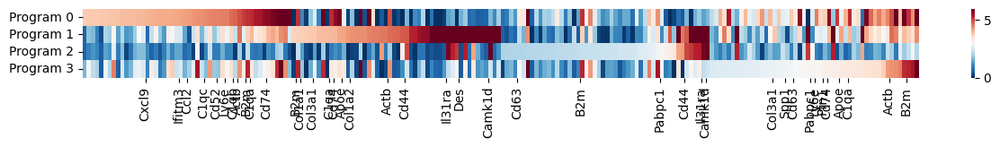

In [6]:
n_top = 50
plt.figure(figsize=(15, 1))

x_names = ['Gzmb', 'Gzmc', 'Cd47', 'Col3a1', 'Cxcl16', 'Stat3', 'Ccl5', 'Irf8', 'Spp1', 'Apoe', 'Tgfbi', 'Ccl8', 'Calm1', 'Cd63',
    'Irf1', 'Cxcl10', 'Cxcl9', 'Ccl2', 'C1qc', 'Cd52', 'C1qb', 'Actb', 'B2m', 'C1qa', 'Cd74', 'Col6a2', 'Col5a2', 'Ccl6', 'Igtbp7',
    'Calm1', 'Cxcl14', 'Ccl8', 'Igfbp4', 'Col1a1', 'Col3a1', 'Col1a2', 'Cd44', 'Camk1d', 'Col16a1', 'Cd47', 'Col4a2', 'Col5a3',
    'Pfn1', 'Igf2r', 'B4galt5', 'Mmp9', 'Snrpf', 'Mmp14', 'Cd63', 'Il31ra', 'Cd9', 'Cd164']

def to_mouse_gene(gene_name_list):
    return [gene_name[0] + gene_name[1:].lower() for gene_name in gene_name_list]

markers = {
    "NK": ["PTPRC", "KLRD1", "MRPL47", "NCR1", "NKG7", "GNLY", "KLRK1", "KLRC1", "GZMB", "KLRF1"], 
    "T": ["PTPRC", "CD3D", "CD3G", "CD3E", "CD8A", "CD4", "TRBC1","TRBC2","TRAC","GNLY", "KLRG1", "GZMB", "PRF1", "GZMK", "CCR7", "IL7R", "SELL", "TCF7", "LAG3", "LAYN", "HAVCR2", "CTLA4", "GGT1", "TIGIT", "CD160", "TOX", "PRDM1", "SOCS1", "EOMES", "TBX21", "BATF", "FOXO1", "CD4", "FOXP3", "GATA3", "TBX21", "CXCR3", "CD8B"], 
    "Macrophages": ["PTPRC", "CD14", "ITGAM", "ITGAX", "TREM2", "FCGR3A", "FCGR3B", "CCR2", "CD163", "CD68", "ARG1", "ADGRE1", "CD33", "CD68", "C1QA", "CD163",  "C1QB", "C1QC",  "MARCO", "CD81"], 
    "DC": ["PTPRC", "ITGAM", "ITGAX", "CD14", "CD33", "CD68", "CD1C", "CD209", "CCL22", "CD86", "CLEC9A", "CLEC10A", "XCR1", "LAMP3"], 
    "Endothelial": ["VWF", "PECAM1", "CLDN5","CDH5","MGP"], 
    "Fibroblasts": ["COL1A1", "COL1A2", "COL3A1","MMP2", "MYL9", "DCN","FAP"], 
    "Malignant": ["MKI67", "EPCAM", "TOP2A", "ASCL2", "CBX3", "HSP90AB1", "ZFAS1", "PABPC1", "GTF3A", "NAP1L1", "TGFBI", "IFITM3", "HSPD1", "NONO", "HSPH1", "NKD1", "LY6E", "C6orf48", "SSB", "RSL1D1", "DPEP1", "DKC1", "BMP4", "GNG4", "CPNE1", "ZDHHC9", "DARS", "SCD", "MYC", "PHLDA1", "DACH1", "CLDN1", "KRT23"], 
    "Epithelial": ["CDH1", "EPCAM", "CDKN2A", "KRT5", "KRT17", "MUC5B"], 
    "SmoothMuscle":["ACTA2", "MY19", "MYH11", "MYLK","TAGLN","MCAM","ACTG2","MGP","DES","TMP1"]
}
for marker in markers:
    x_names += to_mouse_gene(markers[marker])

gene_idx = np.argsort(model.components_, axis=1)[:, -n_top:].flatten()

sns.heatmap(model.components_[:, gene_idx], cmap='RdBu_r', vmax=6)
gene_names = fdata.var_names[gene_idx]

x_idx = np.where(np.isin(gene_names, x_names))[0]

from adjustText import adjust_text

plt.xticks(x_idx, gene_names[x_idx])
plt.yticks(np.array([0, 1, 2, 3]) + 0.5, [f'Program {i}' for i in range(4)], rotation=0)

plt.rcParams['pdf.fonttype']=42
plt.savefig("./plots/nmf_programs.pdf", format="pdf", bbox_inches='tight')
plt.show()

In [81]:
n_top=50
genes = fdata.var_names[np.argsort(model.components_, axis=1)[:, -n_top:].flatten()]

In [133]:
pd.DataFrame(genes).to_csv('./nmf.genes.csv')

In [98]:
from sklearn.cluster import KMeans

plot_data = fdata[fdata.obs.marker == 'B924-1', genes].copy()

cc = KMeans(n_clusters=5, verbose=1, random_state=114514)
clusters = cc.fit_predict(plot_data.X.toarray())
c_df = pd.DataFrame({
    'cluster': clusters
}, index=plot_data.obs_names).sort_values('cluster')

expr_df = pd.DataFrame(plot_data.X.toarray(), index=plot_data.obs_names, columns=plot_data.var_names)

Initialization complete
Iteration 0, inertia 238062.8125.
Iteration 1, inertia 159613.03125.
Iteration 2, inertia 158181.234375.
Iteration 3, inertia 157235.0625.
Iteration 4, inertia 156573.640625.
Iteration 5, inertia 156261.78125.
Iteration 6, inertia 156019.875.
Iteration 7, inertia 155761.203125.
Iteration 8, inertia 155497.6875.
Iteration 9, inertia 155328.046875.
Iteration 10, inertia 155260.3125.
Iteration 11, inertia 155220.515625.
Iteration 12, inertia 155202.890625.
Iteration 13, inertia 155194.9375.
Iteration 14, inertia 155192.984375.
Iteration 15, inertia 155192.59375.
Iteration 16, inertia 155192.421875.
Converged at iteration 16: strict convergence.


/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


[]

<Figure size 700x700 with 0 Axes>

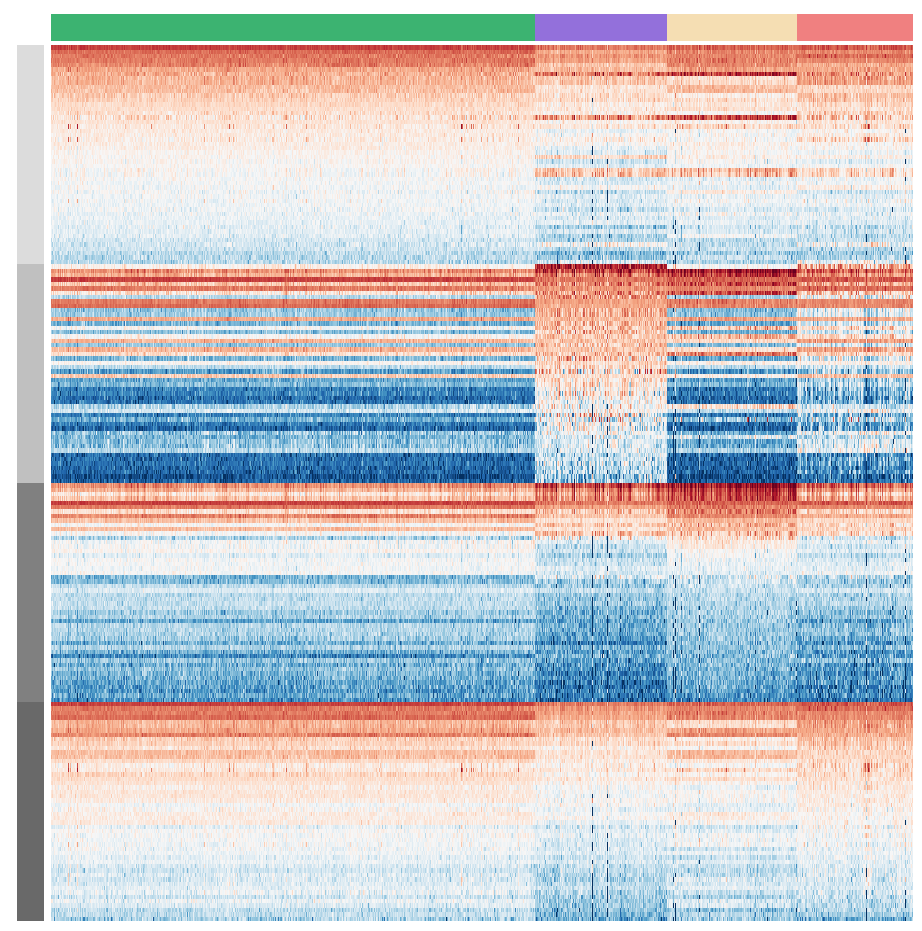

In [114]:
plt.figure(figsize=(7, 7))
colors = []
for i in range(len(c_df.index)):
    if c_df.iloc[i].cluster != 1:
        colors.append(['mediumseagreen', 'powderblue', 'mediumpurple', 'wheat', 'lightcoral'][c_df.iloc[i].cluster])
col_colors = ['gainsboro'] * 50 + ['silver'] * 50 + ['gray'] * 50 + ['dimgray'] * 50
# 计算每个cluster的平均值
mean_values = expr_df.groupby(c_df['cluster']).mean()

# 创建一个排序的索引
gene_df = pd.DataFrame(index=expr_df.index, columns=[])
for i, cluster in enumerate(range(5)):
    if cluster == 4:
        sorted_indices = mean_values.loc[cluster].iloc[0:50].sort_values(ascending=False).index.tolist()
        gene_df = pd.concat([gene_df, expr_df.iloc[:, 0:50].loc[:, sorted_indices]], axis=1)
    if cluster == 2:
        sorted_indices = mean_values.loc[cluster].iloc[50:100].sort_values(ascending=False).index.tolist()
        gene_df = pd.concat([gene_df, expr_df.iloc[:, 50:100].loc[:, sorted_indices]], axis=1)
    if cluster == 3:
        sorted_indices = mean_values.loc[cluster].iloc[100:150].sort_values(ascending=False).index.tolist()
        gene_df = pd.concat([gene_df, expr_df.iloc[:, 100:150].loc[:, sorted_indices]], axis=1)
    if cluster == 0:
        sorted_indices = mean_values.loc[cluster].iloc[150:200].sort_values(ascending=False).index.tolist()
        gene_df = pd.concat([gene_df, expr_df.iloc[:, 150:200].loc[:, sorted_indices]], axis=1)

g = sns.clustermap(gene_df.loc[c_df[c_df.cluster != 1].index, :].T, row_cluster=False, col_cluster=False, vmax=6, vmin=0, cmap='RdBu_r', col_colors=colors, cbar_pos=None, dendrogram_ratio=0.00001, row_colors=col_colors)
g.ax_heatmap.set_xticks([])
g.ax_heatmap.set_yticks([])

In [7]:
fdata_bin100 = sc.read_h5ad('./RNA/Multitime.clustered.h5')
df = pd.DataFrame(fdata_bin100.X.toarray(), index=fdata_bin100.obs_names, columns=fdata_bin100.var_names)
df = pd.concat([df, fdata_bin100.obs.cluster_cellcharter_givenk], axis=1)
df = pd.concat([df, fdata_bin100.obs.marker], axis=1)
df.head()

,A1cf,A2m,A3galt2,A4galt,AA467197,AA543186,AA792892,AA986860,AB124611,AC061963.1,...,Zwint,Zxdb,Zxdc,Zyg11a,Zyg11b,Zyx,Zzz3,a,cluster_cellcharter_givenk,marker
12199,0.0,0.000000,0.0,0.000000,0.00000,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.763110,0.000000,0.000000,9,1-1
1102,0.0,0.000000,0.0,0.000000,0.33913,0.0,0.0,0.0,0.339130,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.952058,0.000000,0.000000,5,1-1
15850,0.0,0.000000,0.0,0.000000,0.00000,0.0,0.0,0.0,0.192047,0.0,...,0.304387,0.0,0.192047,0.0,0.0,0.576141,0.000000,0.000000,10,1-1
16761,0.0,0.286812,0.0,0.000000,0.00000,0.0,0.0,0.0,0.454587,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.805184,0.454587,0.286812,9,1-1
565,0.0,0.389820,0.0,0.617851,0.38982,0.0,0.0,0.0,0.389820,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.905135,0.617851,0.000000,1,1-1


In [8]:
bulk_df = df.groupby(['cluster_cellcharter_givenk', 'marker']).sum().T

In [16]:
bulk_df.columns = [b + '_' + str(a) for a, b in zip(bulk_df.columns.get_level_values(0), bulk_df.columns.get_level_values(1))]
bulk_df.to_csv('./cluster_bulk_df.csv', sep='\t')

In [2]:
# cluster enrichment
fdata_bin100 = sc.read_h5ad('./RNA/Multitime.clustered.h5')
gene_df = pd.DataFrame(fdata_bin100[:, genes].X.toarray(), index=fdata_bin100.obs_names, columns=fdata_bin100[:, genes].var_names)
gene_df = pd.concat([gene_df, fdata_bin100.obs.cluster_cellcharter_givenk], axis=1)
gene_df['x'] = fdata_bin100.obsm['spatial'][:, 0] // 200 * 200
gene_df['y'] = fdata_bin100.obsm['spatial'][:, 1] // 200 * 200
gene_df['marker'] = fdata_bin100.obs.marker.tolist()

NameError: name 'genes' is not defined

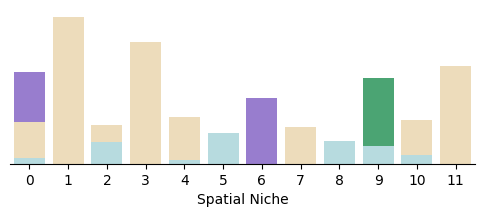

In [114]:
env_df = pd.concat([pd.DataFrame(fdata[c_df[c_df.cluster != 2].index, :].obsm['spatial'] // 200 * 200, index=fdata[c_df[c_df.cluster != 2].index, :].obs_names, columns=['x', 'y']),
    c_df[c_df.cluster != 2].cluster,
    pd.DataFrame(fdata[c_df[c_df.cluster != 2].index, :].obs.marker.map({
    'B926-1': '2-1',
    'B926-2': '2-2',
    'B924-1': '1-1',
    'B924-2': '1-2',
    'B922-1': '3-1',
    'B922-2': '3-2'
}))], axis=1).set_index(['x', 'y', 'marker'])
niche_df = gene_df[['x', 'y', 'marker', 'cluster_cellcharter_givenk']].set_index(['x', 'y', 'marker'])
p_df = env_df.join(niche_df).groupby('cluster').value_counts().reset_index()
plt.figure(figsize=(6, 2))
colors = ['mediumseagreen', 'mediumpurple', 'wheat', 'powderblue']
for i, cluster in enumerate(p_df.cluster.unique()):
    ax = sns.barplot(p_df.loc[p_df.cluster == cluster], x='cluster_cellcharter_givenk', y='count', color=colors[i])
sns.despine()
ax.set_xlabel('Spatial Niche')
ax.spines['left'].set_visible(False)
ax.set_ylabel('')
ax.set_yticks([])

plt.rcParams['pdf.fonttype']=42
plt.savefig("./plots/cluster_environment_proportion.pdf", format="pdf", bbox_inches='tight')

plt.show()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


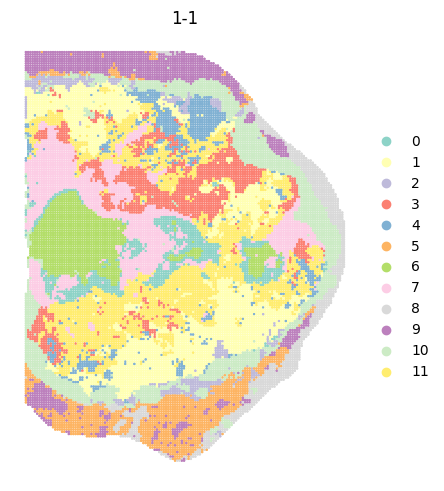

In [144]:
for sample in ['1-1', '1-2', '2-1', '2-2', '3-1', '3-2']:
    axs = sq.pl.spatial_scatter(fdata_bin100[fdata_bin100.obs.marker == sample], color='cluster_cellcharter_givenk', library_key='marker', size=2, shape=None, return_ax=True, palette='Set3')
    axs.set_title(f'{sample}')
    axs.set(frame_on=False)
    axs.set_xlabel('')
    axs.set_ylabel('')
    
    plt.rcParams['pdf.fonttype']=42
    plt.savefig(f"./plots/cluster_plot_raw_{sample}.pdf", format="pdf", bbox_inches='tight')
    break

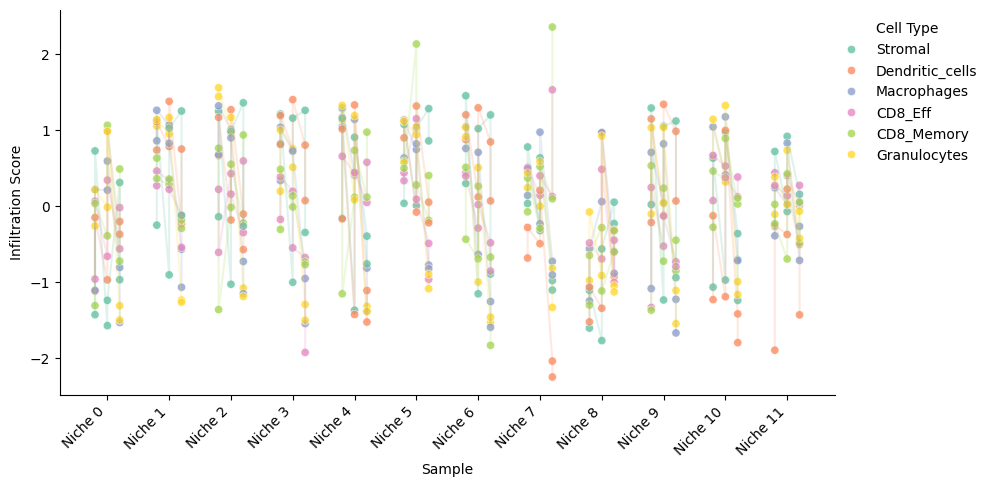

In [98]:
infil_df = pd.read_csv('./bulk_infiltration.csv', sep=',', index_col=0)
infil_df = infil_df.loc[['Stromal', 'Dendritic_cells', 'Macrophages', 'CD8_Eff', 'CD8_Memory', 'Granulocytes'], :]
infil_df = infil_df.melt(ignore_index=False)
infil_df.reset_index(inplace=True)
infil_df['variable'] = infil_df.variable.str.lstrip('X')
infil_df['marker'] = infil_df.variable.str.split('_').str[0]
infil_df['time'] = infil_df.marker.str.split('.').str[0]
infil_df['replicate'] = infil_df.marker.str.split('.').str[1]
infil_df['cluster'] = infil_df.variable.str.split('_').str[1]
infil_df = infil_df.filter(['time', 'cluster', 'value', 'index', 'variable'])

plt.figure(figsize=(10, 5))
# 创建一个新的列用于调整x轴位置，增大不同的time之间的间距
infil_df['x_position'] = infil_df['cluster'].astype('category').cat.codes * 5 + infil_df['time'].astype('category').cat.codes + 1

sns.scatterplot(infil_df, x='x_position', y='value', hue='index', palette='Set2', alpha=0.8)

# 在每个cluster内部连接同一种index类型的线
for cluster in infil_df['cluster'].unique():
    cluster_data = infil_df[infil_df['cluster'] == cluster]
    for index in cluster_data['index'].unique():
        index_data = cluster_data[cluster_data['index'] == index]
        plt.plot(index_data['x_position'], index_data['value'], marker='', linestyle='-', color=sns.color_palette('Set2')[list(cluster_data['index'].unique()).index(index)], alpha=0.2)

plt.xticks(ticks=[a*5+2 for a in range(12)], labels=[f'Niche {cluster}' for cluster in infil_df['cluster'].unique()], rotation=45, ha='right')
plt.legend(title='Cell Type', loc='upper right', bbox_to_anchor=(1.2, 1), frameon=False)
plt.ylabel('Infiltration Score')
plt.xlabel('Sample')
sns.despine()
plt.show()

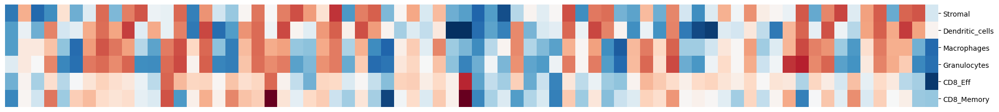

In [2]:

infil_df = pd.read_csv('./bulk_infiltration.csv', sep=',', index_col=0)
infil_df = infil_df.loc[['Stromal', 'Dendritic_cells', 'Macrophages', 'CD8_Eff', 'CD8_Memory', 'Granulocytes'], :]
g = sns.clustermap(infil_df, cmap='RdBu_r', col_cluster=False, vmax=2, vmin=-2, figsize=(20, 3), dendrogram_ratio=0.00001, cbar_pos=None)
g.ax_heatmap.set_xticks([])
plt.show()

In [51]:
all_data = fdata_bin100.copy()
sc.pp.pca(all_data)
sc.pp.neighbors(all_data, n_neighbors=10, n_pcs=15)
sc.tl.umap(all_data)

In [9]:
all_data = fdata_bin100.copy()

In [10]:
sc.pp.neighbors(all_data, n_neighbors=20, n_pcs=20, use_rep='X_scVI')

In [11]:
sc.tl.umap(all_data)

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


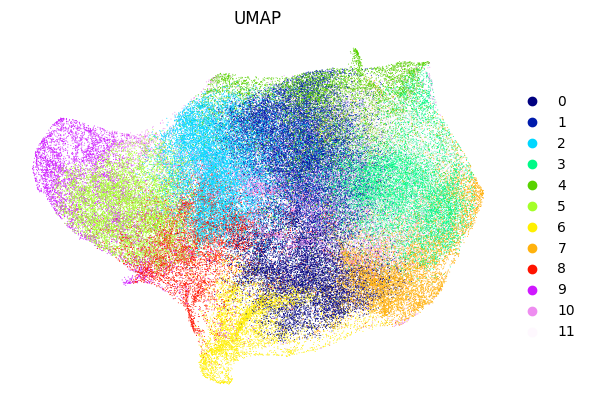

In [12]:
ax = sc.pl.umap(all_data, color='cluster_cellcharter_givenk', title='UMAP', return_fig=True, palette='gist_ncar', size=2)
ax.gca().set(frame_on=False)
ax.gca().set_xlabel('')
ax.gca().set_ylabel('')
plt.rcParams['pdf.fonttype']=42
plt.savefig("./plots/cluster_umap_cellcharter.pdf", format="pdf", bbox_inches='tight')
plt.show()

In [26]:
gdata = sc.read_h5ad('./RNA/Multitime.filtered.guide.bin100.h5')

gdata.obs.marker = gdata.obs.marker.map({
    'B926-1': '2-1',
    'B926-2': '2-2',
    'B924-1': '1-1',
    'B924-2': '1-2',
    'B922-1': '3-1',
    'B922-2': '3-2'
})

all_data.obs['coord_x'] = all_data.obsm['spatial'][:, 0] // 100 * 100
all_data.obs['coord_y'] = all_data.obsm['spatial'][:, 1] // 100 * 100

gdata.obs['coord_x'] = gdata.obsm['spatial'][:, 0] // 100 * 100
gdata.obs['coord_y'] = gdata.obsm['spatial'][:, 1] // 100 * 100
all_data.obs_names = [str(marker) + '_' + str(x) + '_' + str(y) for marker, x, y in zip(all_data.obs['marker'], all_data.obs['coord_x'], all_data.obs['coord_y'])]
gdata.obs_names = [str(marker) + '_' + str(x) + '_' + str(y) for marker, x, y in zip(gdata.obs['marker'], gdata.obs['coord_x'], gdata.obs['coord_y'])]

common_bins = np.intersect1d(all_data.obs_names, gdata.obs_names)
all_data = all_data[common_bins].copy()
gdata = gdata[common_bins].copy()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/IPython/core/interactiveshell.py:3577: SparseEfficiencyWarning: Comparing a sparse matrix with 0 using == is inefficient, try using != instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


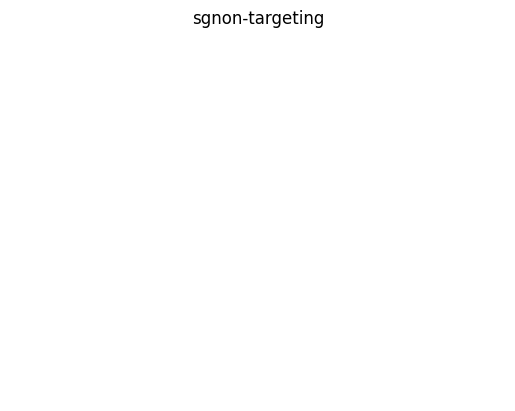

In [27]:
# 自定义调色板，将marker为'3-1'的设置为红色，其余为灰色
guide = 'sgnon-targeting'
palette = ['None' if gdata[marker, guide].X == 0 else 'sgnon-targeting' for marker in gdata.obs_names]
all_data.obs['perturb_gene'] = palette
sc.tl.embedding_density(all_data, basis='umap', groupby='perturb_gene')
# umap_data = fdata_bin100.obsm['X_umap']
# umap_df = pd.DataFrame(umap_data, columns=['UMAP1', 'UMAP2'])
# umap_df['color'] = palette

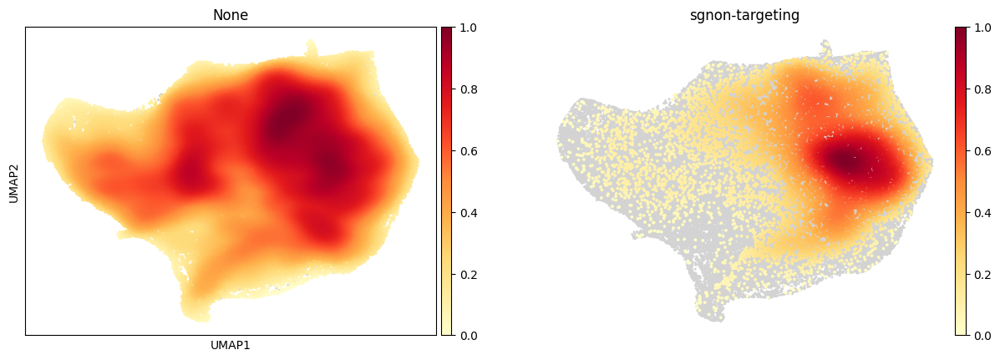

In [29]:
# plt.figure(figsize=(6, 5))
# sns.scatterplot(x='UMAP1', y='UMAP2', data=umap_df, s=1, hue='color', palette=['gray', 'red'], legend=False)
ax = sc.pl.embedding_density(all_data, basis='umap', key='umap_density_perturb_gene', fg_dotsize=30, bg_dotsize=20, return_fig=True)
ax.gca().set_title(f'{guide}')
ax.gca().set_xlabel('')
ax.gca().set_ylabel('')
ax.gca().spines['top'].set_visible(False)
ax.gca().spines['right'].set_visible(False)
ax.gca().spines['left'].set_visible(False)
ax.gca().spines['bottom'].set_visible(False)
plt.gca().set_xticks([])
plt.gca().set_yticks([])
plt.show()

In [31]:
gdata = utils.combine_guide_replicates(gdata)

In [34]:
# 自定义调色板，将marker为'3-1'的设置为红色，其余为灰色
guide = 'sgCd44'
all_data.obs['perturb_gene'] = ['None' if gdata[marker, guide].X == 0 else guide cursoene')

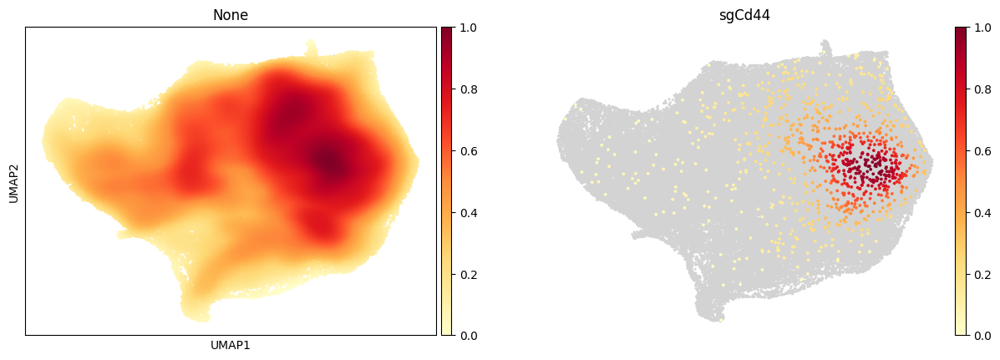

In [35]:
# plt.figure(figsize=(6, 5))
# sns.scatterplot(x='UMAP1', y='UMAP2', data=umap_df, s=1, hue='color', palette=['gray', 'red'], legend=False)
ax = sc.pl.embedding_density(all_data, basis='umap', key='umap_density_perturb_gene', fg_dotsize=30, bg_dotsize=20, return_fig=True)
ax.gca().set_title(f'{guide}')
ax.gca().set_xlabel('')
ax.gca().set_ylabel('')
ax.gca().spines['top'].set_visible(False)
ax.gca().spines['right'].set_visible(False)
ax.gca().spines['left'].set_visible(False)
ax.gca().spines['bottom'].set_visible(False)
ax.gca().set_xticks([])
ax.gca().set_yticks([])
plt.show()

In [67]:
sc.pp.neighbors(all_data, n_neighbors=10, n_pcs=10, use_rep='X_cellcharter', key_added='cellcharter')

In [69]:
sc.tl.umap(all_data, neighbors_key='cellcharter')

In [72]:
all_data

AnnData object with n_obs × n_vars = 118279 × 13177
    obs: 'marker', 'n_genes', 'n_counts', '_scvi_batch', '_scvi_labels', 'cluster_cellcharter_givenk'
    var: 'mt', 'mt-', 'gm', 'Rb', 'rik'
    uns: '_cellcharter', '_scvi_manager_uuid', '_scvi_uuid', 'cluster_cellcharter_givenk_colors', 'log1p', 'rank_genes_groups', 'spatial_neighbors', 'pca', 'neighbors', 'umap', 'cellcharter'
    obsm: 'X_cellcharter', 'X_scVI', 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'spatial_connectivities', 'spatial_distances', 'distances', 'connectivities', 'cellcharter_distances', 'cellcharter_connectivities'

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


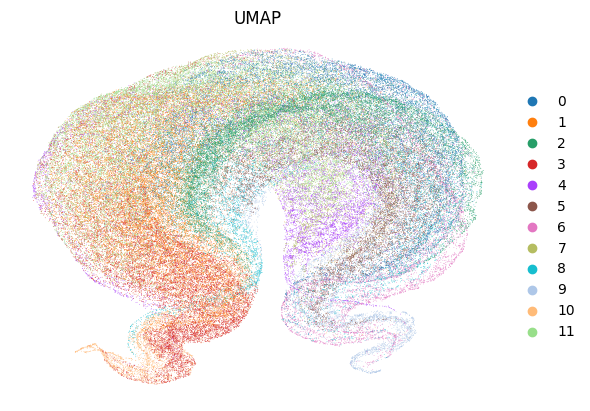

In [71]:
ax = sc.pl.umap(all_data, color='cluster_cellcharter_givenk', title='UMAP', return_fig=True, neighbors_key='cellcharter')
ax.gca().set(frame_on=False)
ax.gca().set_xlabel('')
ax.gca().set_ylabel('')
plt.show()

In [33]:
plot_data = fdata_bin100[fdata_bin100.obs.marker == '2-1'].copy()

sc.pp.pca(plot_data)
sc.pp.neighbors(plot_data, n_neighbors=10, n_pcs=15)
sc.tl.umap(plot_data)

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


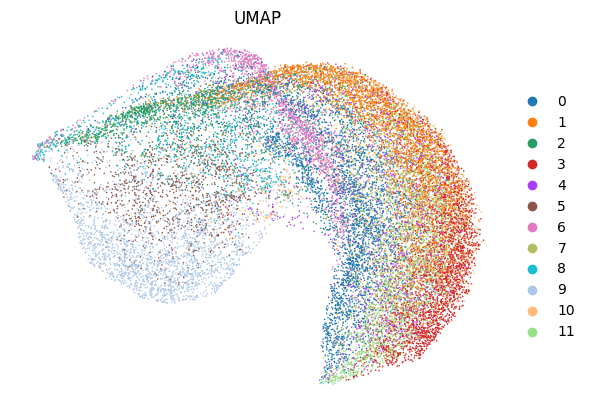

In [50]:
ax = sc.pl.umap(plot_data, color='cluster_cellcharter_givenk', title='UMAP', return_fig=True)
ax.gca().set(frame_on=False)
ax.gca().set_xlabel('')
ax.gca().set_ylabel('')
plt.show()

In [92]:
go_df = pd.DataFrame({
    'Gene': genes,
    'Cluster': [0] * n_top + [1] * n_top + [2] * n_top + [3] * n_top
})
go_df.to_csv('./DEG.csv', sep='\t')
go_df

,Gene,Cluster
0,Psmb9,0
1,Prdx1,0
2,Psmb8,0
3,H3f3b,0
4,H2-T23,0
...,...,...
195,Rack1,3
196,H2-D1,3
197,B2m,3
198,S100a6,3


In [155]:
c_df = pd.DataFrame({
    'Gene': genes,
    'Cluster': [0] * n_top + [1] * n_top + [2] * n_top + [3] * n_top
})
for gene in c_df[c_df.Cluster == 3].Gene:
    print(gene)

Srsf7
H2-T22
Tkt
Gaa
Ecm1
Snrpf
Lamp2
Nudcd3
Cd9
Cdk4
Ifitm1
Aebp1
Cyba
Msn
Mmp9
Myh4
Minos1
Ctsc
Asah1
Ltbp3
Hexa
Grina
Zyx
Calm2
Galk1
Dpt
Rhox5
Itm2c
Atp5k
Fus
Ctdsp2
Junb
Etfb
Id3
Syngr2
Hdgf
Slc38a2
Ptprn
Atox1
Nid1
Cstb
Serpinf1
Nme2
Eif3b
Kctd10
Tyrobp
Fasn
Nap1l1
Atp6v0b
Selenow
Ahnak
Tnnt3
C1qtnf6
Col4a1
Pebp1
Ncl
Grcc10
Irf1
Cd164
Eef1d
Ptprs
Cpe
Ly6c1
Dbi
C4b
Emg1
Bst2
Wdr89
Serp1
Scd1
H1f0
Vamp8
Myl6
Uqcrfs1
Gpi1
Ssr2
Slc25a4
S100a16
Ssrp1
Angptl4
Itgav
Cebpb
Serpinb6a
Bgn
Myh9
Uqcrq
Ddx39b
Ywhae
Ctsa
Clic1
Krt18
Pla2g7
Elob
Cox6b1
Lgals3
Ndufb9
Tpm2
S100a11
Mcrip1
Ctnnb1
Srsf3
Prdx5
Cox7c
Tmbim6
Psmb9
BC005537
Mfge8
Emp3
Anxa1
Hnrnpa2b1
Sh3bgrl3
Ccl8
Ddx17
Pcolce
Mgp
Fabp4
Vcam1
C1qc
Rcn1
Laptm5
Ddb1
Psap
Uqcr11
Clu
Anxa5
Cox5a
Cops9
Tuba1a
Hnrnpu
Crip1
Lgmn
Lama5
Cd52
Mcl1
Ndufa4
Fkbp1a
Col1a1
Cox7a2
Timp1
Eif4g2
Ctss
Psmb10
Cox6c
Gsn
Hspa9
Prdx2
Tspan4
Pdia6
Uqcr10
Tm4sf1
Snrpb
Ccl2
Gnb1
Sem1
Hnrnpab
H3f3b
Col1a2
Hnrnpk
Capns1
Myl12a
Ctsz
Uqcrh
Nme1
C3
Hsp90b1
Lmna
Calm1

In [94]:
!sshpass -p wang2024 ssh wpy@172.16.10.103 "mamba run -n gsea python ~/stereoseq/20240502-SPACseq/enrich.py"

Unnamed: 0     int64
Gene          object
Cluster        int64
dtype: object
/home/wpy/stereoseq/20240502-SPACseq/bin/go-basic.obo: fmt(1.2) rel(2024-04-24) 45,667 Terms
Enrichment analysis for list 0 completed successfully: 265
Enrichment analysis for list 1 completed successfully: 155
Enrichment analysis for list 2 completed successfully: 283
Enrichment analysis for list 3 completed successfully: 233



In [2]:
for i in range(4):
    enr = pd.read_csv(f"./GO/Cluster_{i}.result", sep="\t")
    results = enr.sort_values(by='Combined Score', ascending=False)
    results = results[results["Adjusted P-value"] < 0.05]
    results = results.loc[:, ["Term", "Genes", "Adjusted P-value"]]
    results["Cluster"] = i
    results["Gene Counts"] = results["Genes"].str.split(";").apply(len)
    results["Term"] = results["Term"].str.split("R-HSA").str[0]
    results = results.groupby("Cluster", as_index=False).apply(lambda x: x.sort_values(by='Adjusted P-value')).reset_index(drop=True)
    if not i: go_df = results
    else: go_df = pd.concat([go_df, results], axis=0)
# go_df.to_csv('./GO/Reactome.csv', index=None, sep='\t')
go_df

/tmp/ipykernel_19173/2802901595.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  results = results.groupby("Cluster", as_index=False).apply(lambda x: x.sort_values(by='Adjusted P-value')).reset_index(drop=True)
/tmp/ipykernel_19173/2802901595.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  results = results.groupby("Cluster", as_index=False).apply(lambda x: x.sort_values(by='Adjusted P-value')).reset

,Term,Genes,Adjusted P-value,Cluster,Gene Counts
0,Innate Immune System,C1QB;C1QA;GRN;FCER1G;CTSZ;CYBA;CTSS;PSMB8;PSMB...,3.892031e-11,0,20
1,Neutrophil Degranulation,GRN;FCER1G;CTSZ;CYBA;CTSS;CST3;LGALS3;PRDX5;PK...,3.892031e-11,0,15
2,Immune System,IFITM3;C1QB;CD74;C1QA;GRN;FCER1G;CTSZ;CYBA;CTS...,3.825320e-10,0,24
3,Antigen processing-Cross Presentation,CYBA;B2M;CTSS;PSMB8;TAPBP;PSMB9,1.494446e-05,0,6
4,Classical Antibody-Mediated Complement Activat...,C1QB;C1QA;C1QC,1.550040e-05,0,3
...,...,...,...,...,...
21,"Platelet Activation, Signaling And Aggregation",CD63;TMSB4X;CALU;PFN1,3.919468e-02,3,4
22,Collagen Degradation,CTSD;CTSB,4.555074e-02,3,2
23,Carboxyterminal Post-Translational Modificatio...,TUBA1C;TUBA1B,4.581843e-02,3,2
24,Death Receptor Signaling,RACK1;SQSTM1;RTN4,4.642696e-02,3,3


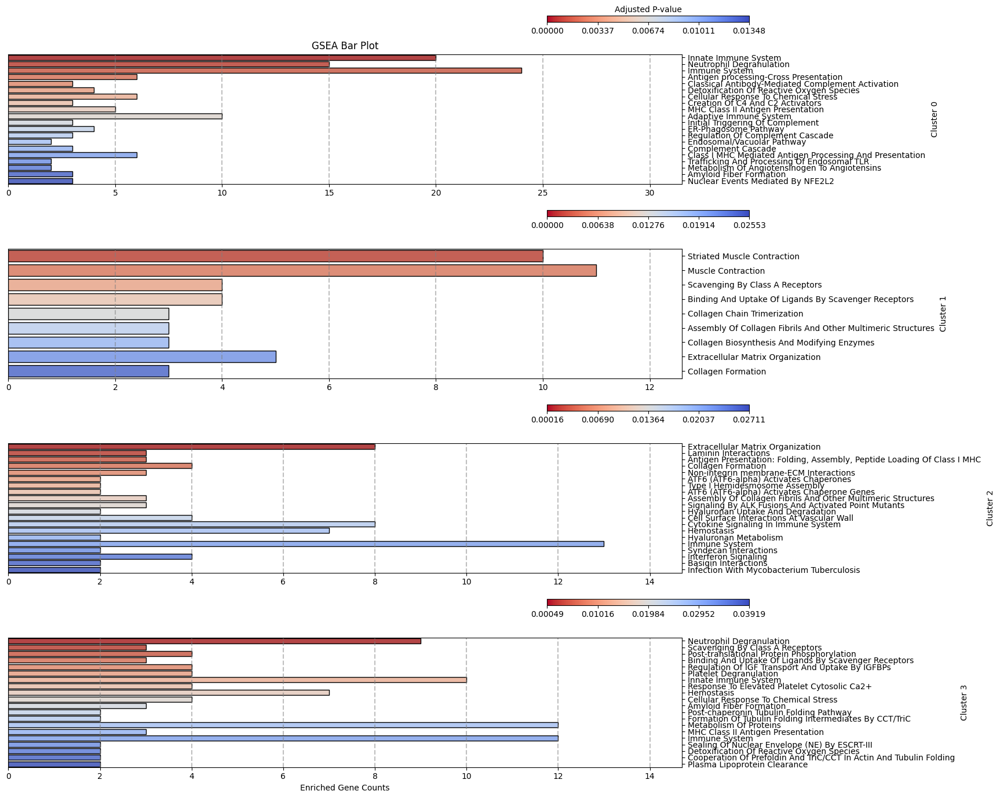

In [3]:
from matplotlib.ticker import FormatStrFormatter
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
fig, ax = plt.subplots(4, 1, figsize=(15, 16))
for cluster in range(4):
    gsea_results = go_df[go_df["Cluster"] == cluster][:20]

    barplot = sns.barplot(
        x='Gene Counts', 
        y='Term', 
        data=gsea_results, 
        palette="coolwarm_r",
        edgecolor='black',
        ax=ax[cluster]
    )
    for tick in ax[cluster].get_xticks():
        ax[cluster].axvline(x=tick, linestyle='--', color='gray', alpha=0.5)

    norm = plt.Normalize(gsea_results['Adjusted P-value'].min(), gsea_results['Adjusted P-value'].max())
    sm = plt.cm.ScalarMappable(cmap="coolwarm_r", norm=norm)
    sm.set_array([])
    cax = inset_axes(ax[cluster], width="30%", height="5%", loc='upper right',
                     bbox_to_anchor=(0.1, 0.3, 1, 1), bbox_transform=ax[cluster].transAxes, borderpad=0)
    if cluster == 0:
        cbar = fig.colorbar(sm, cax=cax, label="Adjusted P-value", orientation='horizontal', shrink=0.1)
        cbar.ax.xaxis.set_label_position('top')
    else: cbar = fig.colorbar(sm, cax=cax, orientation='horizontal', shrink=0.1)

    cbar_ticks = np.linspace(gsea_results['Adjusted P-value'].min(), gsea_results['Adjusted P-value'].max(), num=5)  # Adjust num for density
    cbar.set_ticks(cbar_ticks)
    cbar.ax.yaxis.set_major_formatter(FormatStrFormatter('%.4f'))

    ax[cluster].yaxis.tick_right()
    ax[cluster].yaxis.set_label_position('right')

    ax[cluster].set_xlabel('')
    ax[cluster].set_ylabel(f'Cluster {cluster}')

plt.subplots_adjust(hspace=0.5)
ax[0].set_title('GSEA Bar Plot')
ax[3].set_xlabel('Enriched Gene Counts')
plt.show()

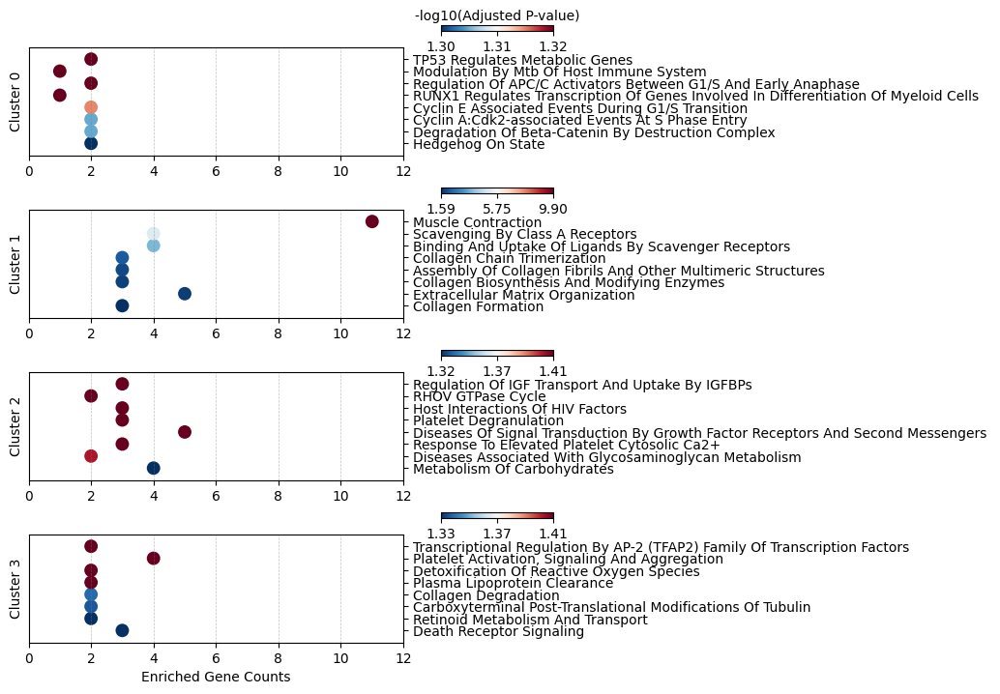

In [55]:
from matplotlib.ticker import FormatStrFormatter
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
fig, ax = plt.subplots(4, 1, figsize=(5, 8))
for cluster in range(4):
    gsea_results = go_df[go_df["Cluster"] == cluster].sort_values(by='Adjusted P-value', ascending=False)[:8]
    gsea_results['Adjusted P-value'] = -np.log10(gsea_results['Adjusted P-value'])

    barplot = sns.scatterplot(
        x='Gene Counts', 
        y='Term', 
        data=gsea_results,
        hue='Adjusted P-value',
        palette="RdBu_r",
        edgecolor='none',
        ax=ax[cluster],
        legend=False,
        s=100,
    )

    norm = plt.Normalize(gsea_results['Adjusted P-value'].min(), gsea_results['Adjusted P-value'].max())
    sm = plt.cm.ScalarMappable(cmap="RdBu_r", norm=norm)
    sm.set_array([])
    cax = inset_axes(ax[cluster], width="30%", height="5%", loc='upper right',
                     bbox_to_anchor=(0.4, 0.2, 1, 1), bbox_transform=ax[cluster].transAxes, borderpad=0)
    if cluster == 0:
        cbar = fig.colorbar(sm, cax=cax, label="-log10(Adjusted P-value)", orientation='horizontal', shrink=0.1)
        cbar.ax.xaxis.set_label_position('top')
    else: cbar = fig.colorbar(sm, cax=cax, orientation='horizontal', shrink=0.05)

    cbar_ticks = np.linspace(gsea_results['Adjusted P-value'].min(), gsea_results['Adjusted P-value'].max(), num=3)  # Adjust num for density
    cbar.set_ticks(cbar_ticks)
    cbar.ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))

    ax[cluster].yaxis.tick_right()
    ax[cluster].yaxis.set_label_position('right')

    for tick in ax[cluster].get_yticklabels():
        tick.set_fontsize(10)  # 设置yticklabel文字大小为12

    ax[cluster].set_xlabel('')
    ax[cluster].set_ylabel(f'Cluster {cluster}')
    ax[cluster].yaxis.set_label_position('left')
    ax[cluster].set_ylim([-1, 8])
    ax[cluster].set_xlim([0, 12])
    ax[cluster].sharex(ax[0])

    for tick in ax[cluster].get_xticks():
        ax[cluster].axvline(x=tick, linestyle='--', color='gray', alpha=0.5, linewidth=0.5)

plt.subplots_adjust(hspace=0.5)
# ax[0].set_title('GSEA Bar Plot')
ax[3].set_xlabel('Enriched Gene Counts')
plt.rcParams['pdf.fonttype']=42
plt.savefig("./plots/nmf_programs_gsea.pdf", format="pdf", bbox_inches='tight')
plt.show()

In [175]:
go_df = pd.DataFrame()
for i in range(1, 5):
    df = pd.read_csv(f'./GO/NMF_GO_result_{i}.csv', sep='\t')
    go_df = pd.concat([go_df, df], axis=0)
go_df.reset_index(drop=True).to_csv('./GO/NMF_GO_results_all.csv', sep='\t')

In [194]:
import numpy as np
from scipy.stats import pearsonr
from concurrent.futures import ThreadPoolExecutor
from tqdm import tqdm

# Function to compute correlations for a given row i
def compute_correlation(i, gene_matrix, n_genes):
    row_corr = np.zeros(n_genes)
    for j in range(i, n_genes):
        row_corr[j] = pearsonr(gene_matrix[:, i], gene_matrix[:, j])[0]
    return i, row_corr

# Number of genes
n_genes = len(genes)
gene_matrix = fdata[:, genes].X.toarray()
corr_matrix = np.zeros([n_genes, n_genes])

# Use ThreadPoolExecutor with 16 threads
with ThreadPoolExecutor(max_workers=32) as executor:
    futures = [executor.submit(compute_correlation, i, gene_matrix, n_genes) for i in range(n_genes)]
    
    # Collect results with progress bar
    for future in tqdm(futures, total=n_genes):
        i, row_corr = future.result()
        corr_matrix[i, i:] = row_corr[i:]

print("Parallel computation completed successfully!")

100%|██████████| 1000/1000 [16:36<00:00,  1.00it/s]

Parallel computation completed successfully!


In [195]:
n_genes = corr_matrix.shape[0]
for i in range(n_genes):
    for j in range(i):
        corr_matrix[i, j] = corr_matrix[j, i]

In [196]:
idxs = []
for i in range(1, 5):
    g = sns.clustermap(corr_matrix[n_top*(i-1):n_top*i, n_top*(i-1):n_top*i])
    idxs += list(np.array(g.dendrogram_col.reordered_ind) + n_top * (i-1))
    plt.clf()
print(idxs)

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may g

[96, 132, 246, 239, 247, 127, 230, 188, 164, 175, 102, 125, 36, 207, 227, 26, 174, 140, 121, 145, 136, 182, 172, 176, 237, 205, 220, 201, 216, 221, 146, 165, 163, 194, 160, 198, 169, 193, 178, 156, 159, 18, 48, 112, 5, 74, 109, 138, 73, 120, 89, 106, 59, 7, 47, 29, 81, 88, 49, 53, 78, 20, 42, 79, 155, 171, 108, 143, 51, 151, 94, 98, 84, 115, 2, 103, 67, 71, 34, 70, 40, 90, 93, 105, 111, 8, 39, 210, 224, 219, 231, 222, 211, 223, 225, 238, 189, 192, 204, 199, 215, 213, 185, 233, 234, 187, 209, 212, 206, 214, 202, 200, 203, 180, 181, 183, 168, 150, 152, 249, 244, 245, 241, 242, 236, 243, 229, 232, 217, 240, 226, 228, 248, 196, 235, 75, 87, 91, 128, 114, 148, 14, 122, 130, 33, 38, 46, 80, 22, 60, 17, 30, 66, 12, 31, 104, 28, 13, 126, 9, 10, 15, 11, 6, 44, 3, 52, 101, 97, 166, 129, 131, 173, 186, 157, 158, 197, 170, 167, 177, 153, 162, 137, 133, 116, 118, 57, 107, 195, 191, 208, 218, 190, 154, 179, 23, 62, 45, 1, 54, 119, 142, 58, 113, 63, 86, 123, 135, 55, 92, 64, 77, 161, 83, 117, 65, 72,

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

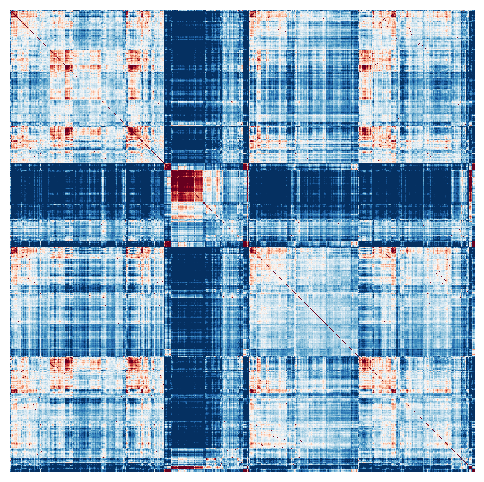

In [383]:
plt.figure(figsize=(6, 6))
c_df = pd.DataFrame(corr_matrix, index=genes, columns=genes)
g = sns.heatmap(c_df.iloc[idxs, idxs], cmap='RdBu_r', vmin=0, vmax=0.5, cbar=False)
g.set_xticks([])
g.set_yticks([])
plt.rcParams['pdf.fonttype']=42
plt.savefig("./plots/nmf_programs_corr.pdf", format="pdf", bbox_inches='tight')
plt.show()

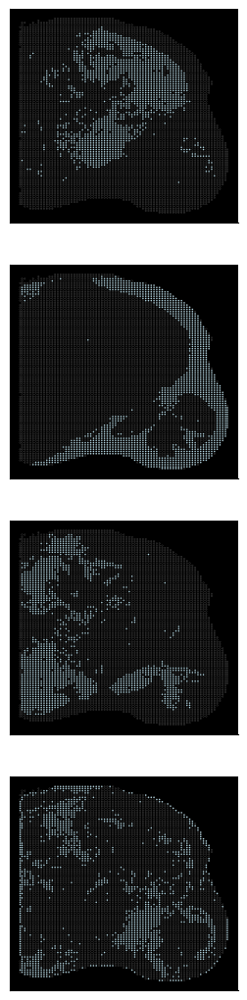

In [46]:
_, ax = plt.subplots(4, 1, figsize=(3, 13))
sample = 'B926-1'
for i in range(4):
    sns.scatterplot(x=fdata[fdata.obs.marker == sample,:].obsm['spatial'][:, 0], y=fdata[fdata.obs.marker == sample,:].obsm['spatial'][:, 1],
        hue=cnt_matrix_trans[fdata.obs.marker == sample, i] > np.quantile(cnt_matrix_trans[fdata.obs.marker == sample, i], 0.75), ax=ax[i], s=1,
        palette=['black', 'lightblue'], legend=False)
    ax[i].set_facecolor('black')
    ax[i].invert_yaxis()
    ax[i].set_xticks([])
    ax[i].set_yticks([])
# plt.rcParams['pdf.fonttype']=42
# plt.savefig("./plots/nmf_programs_plot.pdf", format="pdf", bbox_inches='tight')
sns.despine()

In [56]:
gdata = utils.combine_guide_replicates(gdata)

In [1]:
proportions_df

NameError: name 'proportions_df' is not defined

AttributeError: Rectangle.set() got an unexpected keyword argument 'vmin'

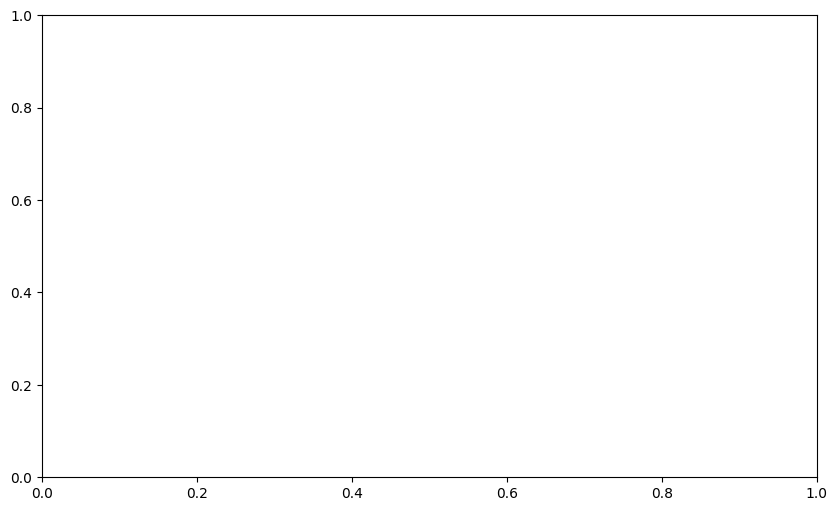

In [102]:
sample = 'B926-1'
proportions = []

for i in range(4):
    mask = cnt_matrix_trans[fdata.obs.marker == sample, i] > np.quantile(cnt_matrix_trans[fdata.obs.marker == sample, i], 0.75)
    df = pd.DataFrame(np.array(gdata[gdata.obs.marker == sample, :][mask, :].X.sum(axis=0).flatten()), index=gdata.var_names)
    df.columns = ['guide']
    df['mask'] = f'Mask {i}'
    proportions.append(df)

proportions_df = pd.concat(proportions)
proportions_df.reset_index(inplace=True)
proportions_df.rename(columns={'index': 'guide_name'}, inplace=True)
proportions_df['proportion'] = proportions_df.groupby('guide_name')['guide'].transform(lambda x: x / x.sum())

proportions_pivot = proportions_df.pivot(index='guide_name', columns='mask', values='proportion')
proportions_pivot = proportions_pivot[['Mask 0', 'Mask 1', 'Mask 2', 'Mask 3']]

# 按照Mask2的Proportion由小到大排列
proportions_pivot = proportions_pivot.sort_values(by='Mask 1')

# 更改Legend的名字
cmap = sns.color_palette("Reds", as_cmap=True)
cmap = cmap(np.linspace(0.5, 1, 256))  # 只取>0.5的部分
fig = proportions_pivot.plot(kind='bar', stacked=True, figsize=(10, 6), color=cmap)  # 调整cmap的范围
# fig.set_facecolor('black')  # 设置背景为黑色
plt.legend(['Tumor', 'Fibro', 'Infiltration', 'Necrosis'], bbox_to_anchor=(1.05, 1), loc='upper left', facecolor='black', fontsize='small')
# plt.gca().tick_params(colors='white')  # 设置ticks为白色
# plt.xticks(color='white')  # 设置x轴字体为白色
# plt.yticks(color='white')  # 设置y轴字体为白色
plt.title('Proportions by Mask', color='black')  # 设置标题字体为白色
sns.despine()
plt.show()

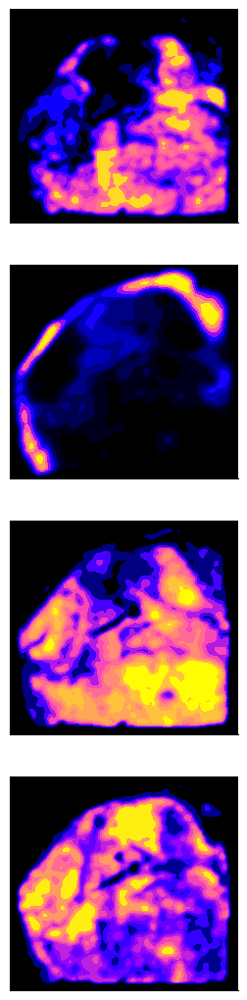

In [36]:
_, ax = plt.subplots(4, 1, figsize=(3, 13))
sample = 'B922-1'
for i in range(4):
    sns.kdeplot(x=fdata[fdata.obs.marker == sample,:].obsm['spatial'][:, 0], y=fdata[fdata.obs.marker == sample,:].obsm['spatial'][:, 1],
        weights=cnt_matrix_trans[fdata.obs.marker == sample, i], fill=True,
        bw_adjust=0.2, cmap='gnuplot2', ax=ax[i])
    ax[i].set_facecolor('black')
    ax[i].invert_yaxis()
    ax[i].set_xticks([])
    ax[i].set_yticks([])
# plt.rcParams['pdf.fonttype']=42
# plt.savefig("./plots/nmf_programs_plot.pdf", format="pdf", bbox_inches='tight')
sns.despine()

In [257]:
n_corr_genes = 200
gene_matrix = np.array([fdata[gdata.X.sum(axis=1) > 0, idxs[:1+n_corr_genes]].X.toarray().sum(axis=1).tolist(),
    fdata[gdata.X.sum(axis=1) > 0, idxs[251:251+n_corr_genes]].X.toarray().sum(axis=1).tolist(),
    fdata[gdata.X.sum(axis=1) > 0, idxs[501:501+n_corr_genes]].X.toarray().sum(axis=1).tolist(),
    fdata[gdata.X.sum(axis=1) > 0, idxs[751:751+n_corr_genes]].X.toarray().sum(axis=1).tolist()]).T
gene_matrix.shape

(22631, 4)

In [262]:
guide_matrix = gdata_trans[gdata_trans.X.sum(axis=1) > 0, :].X.toarray()
guide_matrix.shape

(22631, 67)

In [271]:
gdata_trans = utils.combine_guide_replicates(gdata_trans)

In [272]:
guide_matrix = gdata_trans[gdata_trans.X.sum(axis=1) > 0, :].X.toarray()

guide_corr_matrix = np.zeros((4, len(gdata_trans.var_names)))
for i in tqdm(range(4)):
    for j in range(len(gdata_trans.var_names)):
        guide_corr_matrix[i, j] = pearsonr(gene_matrix[:, i], guide_matrix[:, j])[0]

100%|██████████| 4/4 [00:00<00:00, 10.81it/s]


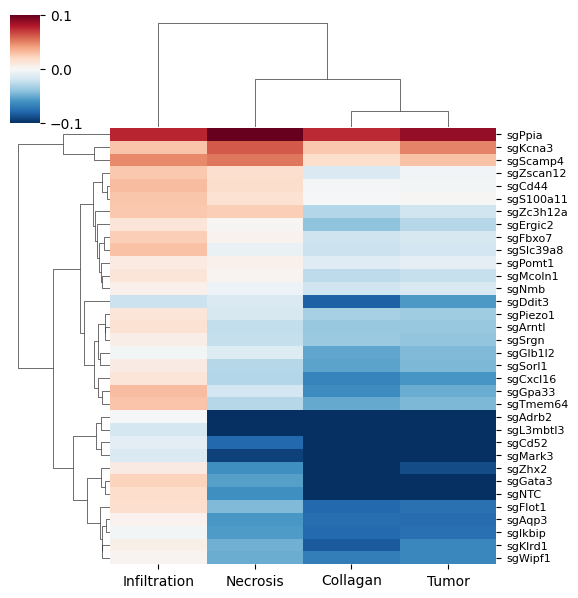

In [273]:
c_df = pd.DataFrame(guide_corr_matrix, columns=gdata_trans.var_names, index=list(range(1, 5))).T
# c_df = c_df.iloc[:, idxs]
g = sns.clustermap(c_df, col_cluster=True, cmap='RdBu_r', vmin=-0.1, vmax=0.1, figsize=(6, 6))#, dendrogram_ratio=0.0001, cbar_pos=None)
g.ax_heatmap.set_yticks(np.array(list(range(len(gdata_trans.var_names)))) + 0.5, gdata_trans.var_names[g.dendrogram_row.reordered_ind], size=8)
g.ax_heatmap.set_xticks([0.5, 1.5, 2.5, 3.5], ['Infiltration', 'Necrosis', 'Collagan', 'Tumor'])
plt.show()

In [9]:
fdata_bin100 = sc.read_h5ad('./RNA/Multitime.clustered.h5')
gene_df = pd.DataFrame(fdata_bin100[:, genes].X.toarray(), index=fdata_bin100.obs_names, columns=fdata_bin100[:, genes].var_names)
gene_df = pd.concat([gene_df, fdata_bin100.obs.cluster_cellcharter_givenk], axis=1)

In [45]:
sns.clustermap?

Signature:
sns.clustermap(
    data,
    *,
    pivot_kws=None,
    method='average',
    metric='euclidean',
    z_score=None,
    standard_scale=None,
    figsize=(10, 10),
    cbar_kws=None,
    row_cluster=True,
    col_cluster=True,
    row_linkage=None,
    col_linkage=None,
    row_colors=None,
    col_colors=None,
    mask=None,
    dendrogram_ratio=0.2,
    colors_ratio=0.03,
    cbar_pos=(0.02, 0.8, 0.05, 0.18),
    tree_kws=None,
    **kwargs,
)
Docstring:
Plot a matrix dataset as a hierarchically-clustered heatmap.

This function requires scipy to be available.

Parameters
----------
data : 2D array-like
    Rectangular data for clustering. Cannot contain NAs.
pivot_kws : dict, optional
    If `data` is a tidy dataframe, can provide keyword arguments for
    pivot to create a rectangular dataframe.
method : str, optional
    Linkage method to use for calculating clusters. See
    :func:`scipy.cluster.hierarchy.linkage` documentation for more
    information.
metric : str, o

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


[]

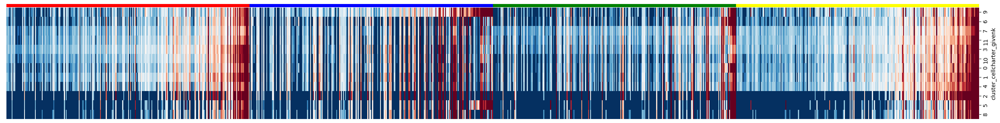

In [55]:
# plt.figure()
cluster_gene_df = gene_df.groupby('cluster_cellcharter_givenk').quantile(0.5)
colors = ['red'] * n_top + ['blue'] * n_top + ['green'] * n_top + ['yellow'] * n_top
g = sns.clustermap(cluster_gene_df, cmap='RdBu_r', vmax=2, vmin=0, col_cluster=False, figsize=(25, 4), cbar_pos=None, col_colors=colors, dendrogram_ratio=0.00001)
g.ax_heatmap.set_yticks(np.array(list(range(12)))+0.5, np.array(list(range(12)))[g.dendrogram_row.reordered_ind])
# g.ax_heatmap.set_yticks(np.array(list(range(12)))+0.5, np.array(list(range(12))))
g.ax_heatmap.set_xticks([])

# sns.boxplot(data=bar_gene_df.T, hue='program')

# plt.rcParams['pdf.fonttype']=42
# plt.savefig("./plots/nmf_programs_cluster.pdf", format="pdf", bbox_inches='tight')

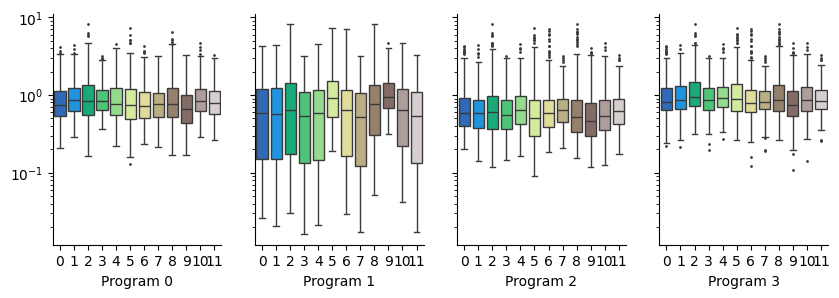

In [39]:
_, ax = plt.subplots(1, 4, figsize=(10, 3), sharey=True)
for i in range(4):
    sns.boxplot(cluster_gene_df.iloc[:, n_top*i:n_top*(i+1)].T, ax=ax[i], palette='terrain', fliersize=1, log_scale=True)
    ax[i].set_xlabel(f'Program {i}')
    if i > 0: ax[i].set_yticks([])
sns.despine()

In [ ]:
n_corr_genes = 250
gene_matrix = np.array([fdata[gdata.X.sum(axis=1) > 0, idxs[:1+n_corr_genes]].X.toarray().sum(axis=1).tolist(),
    fdata[gdata.X.sum(axis=1) > 0, idxs[251:251+n_corr_genes]].X.toarray().sum(axis=1).tolist(),
    fdata[gdata.X.sum(axis=1) > 0, idxs[501:501+n_corr_genes]].X.toarray().sum(axis=1).tolist(),
    fdata[gdata.X.sum(axis=1) > 0, idxs[751:751+n_corr_genes]].X.toarray().sum(axis=1).tolist()]).T
pd.DataFrame([gene_matrix, fdata.obs

In [78]:
import numpy as np
from scipy.stats import pearsonr
from concurrent.futures import ThreadPoolExecutor
from tqdm import tqdm

# Function to compute correlations for a given row i
def compute_correlation(i, gene_matrix, n_genes):
    row_corr = np.zeros(n_genes)
    for j in range(i, n_genes):
        row_corr[j] = pearsonr(gene_matrix[:, i], gene_matrix[:, j])[0]
    return i, row_corr

# Number of genes
n_genes = len(hvg_fdata.var_names)
gene_matrix = hvg_fdata.X.toarray()
corr_matrix = np.zeros([n_genes, n_genes])

# Use ThreadPoolExecutor with 16 threads
with ThreadPoolExecutor(max_workers=32) as executor:
    futures = [executor.submit(compute_correlation, i, gene_matrix, n_genes) for i in range(n_genes)]
    
    # Collect results with progress bar
    for future in tqdm(futures, total=n_genes):
        i, row_corr = future.result()
        corr_matrix[i, i:] = row_corr[i:]

print("Parallel computation completed successfully!")

100%|██████████| 818/818 [11:36<00:00,  1.17it/s] 

Parallel computation completed successfully!


In [42]:
import numpy as np
from scipy.stats import pearsonr
from concurrent.futures import ThreadPoolExecutor
from tqdm import tqdm

# Function to compute correlations for a given row i
def compute_correlation(i, gene_matrix, n_genes):
    row_corr = np.zeros(n_genes)
    for j in range(i, n_genes):
        row_corr[j] = pearsonr(gene_matrix[:, i], gene_matrix[:, j])[0]
    return i, row_corr

# Number of genes
n_genes = len(hvg_fdata.var_names)
gene_matrix = hvg_fdata.X.toarray()
corr_matrix = np.zeros([n_genes, n_genes])

# Use ThreadPoolExecutor with 16 threads
with ThreadPoolExecutor(max_workers=32) as executor:
    futures = [executor.submit(compute_correlation, i, gene_matrix, n_genes) for i in range(n_genes)]
    
    # Collect results with progress bar
    for future in tqdm(futures, total=n_genes):
        i, row_corr = future.result()
        corr_matrix[i, i:] = row_corr[i:]

print("Parallel computation completed successfully!")

  0%|          | 0/1471 [00:00<?, ?it/s]

In [79]:
np.savetxt('./gene_program_t_bin200.txt', corr_matrix)

In [119]:
corr_matrix = np.loadtxt('./gene_program_bin200.txt')

In [120]:
n_genes = len(hvg_fdata.var_names)
for i in range(n_genes):
    for j in range(i):
        corr_matrix[i, j] = corr_matrix[j, i]

In [121]:
corr_matrix[np.isnan(corr_matrix)] = 0

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


[]

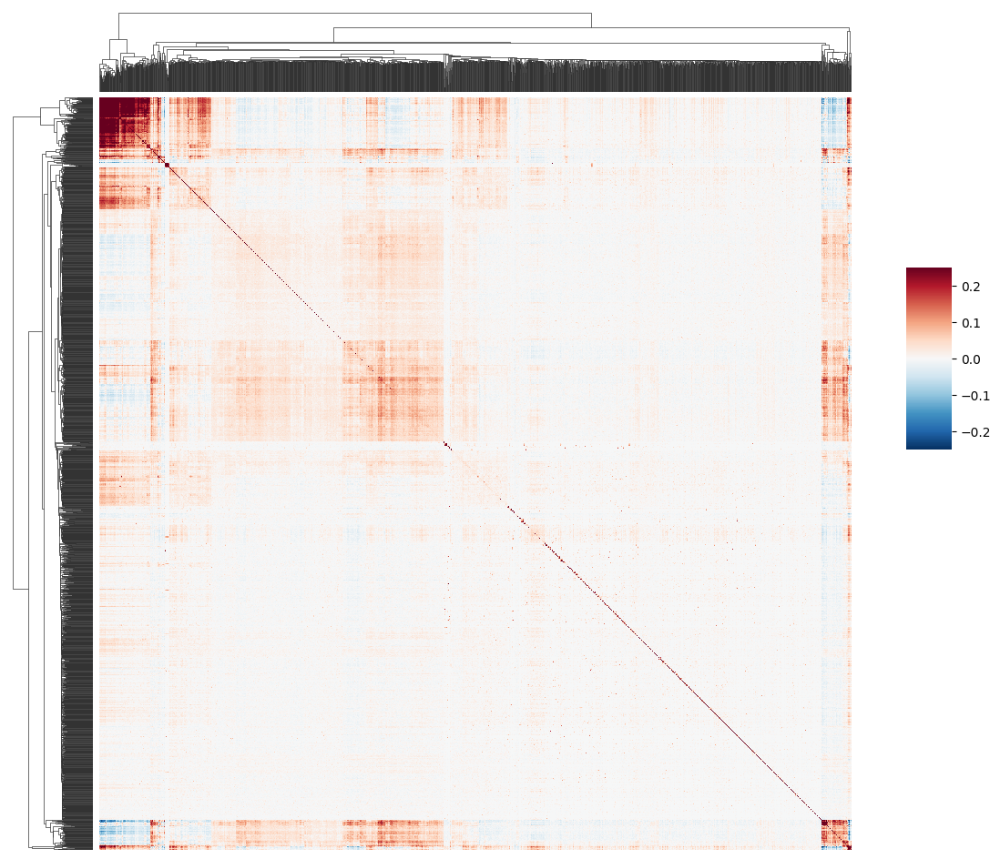

In [122]:
g = sns.clustermap(corr_matrix, cmap='RdBu_r', vmax=0.25, vmin=-0.25, dendrogram_ratio=0.1, cbar_pos=[1, 0.5, 0.05, 0.2])
g.ax_heatmap.set_xticks([])
g.ax_heatmap.set_yticks([])

# plt.rcParams['pdf.fonttype']=42
# plt.savefig("./plots/program_hvg_bin200_raw.pdf", format="pdf", bbox_inches='tight')

In [124]:
hvg_fdata

AnnData object with n_obs × n_vars = 30061 × 2000
    obs: 'marker'
    var: 'mt', 'mt-', 'gm', 'Rb', 'rik', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    obsm: 'spatial'
    layers: 'counts'

In [123]:
from sklearn.decomposition import NMF
model = NMF()
model.fit(corr_matrix)

ValueError: Negative values in data passed to NMF (input X)

In [84]:
from bin import consensus_cluster
from sklearn.cluster import AgglomerativeClustering
# clustering_obj = AgglomerativeClustering(metric='euclidean', linkage='average')
cc = consensus_cluster.ConsensusCluster(AgglomerativeClustering, L=2, K=5, H=20, resample_proportion=0.8)
cc.fit(corr_matrix, verbose=True)

At k = 2, aka. iteration = 0
	At resampling h = 0, (k = 2)
	At resampling h = 1, (k = 2)
	At resampling h = 2, (k = 2)
	At resampling h = 3, (k = 2)
	At resampling h = 4, (k = 2)
	At resampling h = 5, (k = 2)
	At resampling h = 6, (k = 2)
	At resampling h = 7, (k = 2)
	At resampling h = 8, (k = 2)
	At resampling h = 9, (k = 2)
	At resampling h = 10, (k = 2)
	At resampling h = 11, (k = 2)
	At resampling h = 12, (k = 2)
	At resampling h = 13, (k = 2)
	At resampling h = 14, (k = 2)
	At resampling h = 15, (k = 2)
	At resampling h = 16, (k = 2)
	At resampling h = 17, (k = 2)
	At resampling h = 18, (k = 2)
	At resampling h = 19, (k = 2)
At k = 3, aka. iteration = 1
	At resampling h = 0, (k = 3)
	At resampling h = 1, (k = 3)
	At resampling h = 2, (k = 3)
	At resampling h = 3, (k = 3)
	At resampling h = 4, (k = 3)
	At resampling h = 5, (k = 3)
	At resampling h = 6, (k = 3)
	At resampling h = 7, (k = 3)
	At resampling h = 8, (k = 3)
	At resampling h = 9, (k = 3)
	At resampling h = 10, (k = 3)
	

In [88]:
clusters = cc.predict_data(corr_matrix)

In [66]:
from consensusclustering import ConsensusClustering
from sklearn.cluster import AgglomerativeClustering
clustering_obj = AgglomerativeClustering(metric='euclidean', linkage='average')
cc = ConsensusClustering(
    clustering_obj=clustering_obj,
    min_clusters=2,
    max_clusters=9,
    n_resamples=50,
    resample_frac=0.5,
    k_param='n_clusters'
)
cc.fit(corr_matrix, progress_bar=True)

Computing consensus matrices:   0%|          | 0/8 [00:00<?, ?it/s]

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/consensusclustering/consensus.py:118: RuntimeWarning: invalid value encountered in divide
  np.sum(connectivity_matrices, axis=0) / np.sum(identity_matrices, axis=0), nan=0
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/consensusclustering/consensus.py:118: RuntimeWarning: invalid value encountered in divide
  np.sum(connectivity_matrices, axis=0) / np.sum(identity_matrices, axis=0), nan=0
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/consensusclustering/consensus.py:118: RuntimeWarning: invalid value encountered in divide
  np.sum(connectivity_matrices, axis=0) / np.sum(identity_matrices, axis=0), nan=0
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/consensusclustering/consensus.py:118: RuntimeWarning: invalid value encountered in divide
  np.sum(connectivity_matrices, axis=0) / np.sum(identity_matrices, axis=0), nan=0
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-package

In [125]:
cc = AgglomerativeClustering(n_clusters=2, metric='euclidean').fit(corr_matrix)
cdf = pd.DataFrame({
    'cluster': cc.fit_predict(corr_matrix)
}, index=hvg_fdata.var_names.tolist()).sort_values('cluster')

<Axes: >

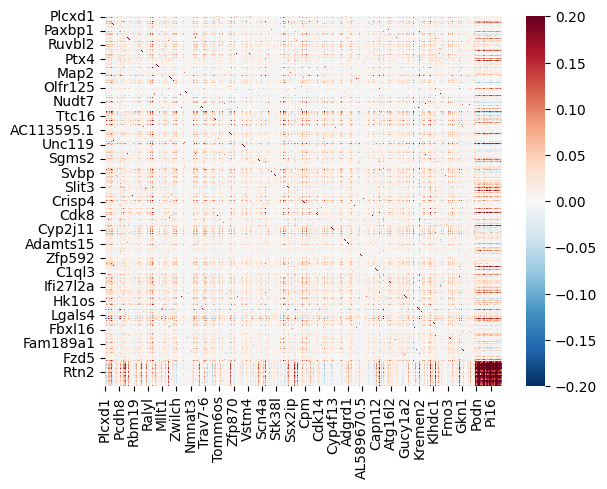

In [126]:
rdf = pd.DataFrame(corr_matrix, index=hvg_fdata.var_names, columns=hvg_fdata.var_names)
sns.heatmap(rdf.loc[cdf.index, cdf.index], cmap='RdBu_r', vmax=0.2, vmin=-0.2)

In [31]:
from scipy.cluster.hierarchy import fcluster

linkage = g.dendrogram_col.linkage
clusters = fcluster(linkage, t=15, criterion='maxclust')
cluster_df = pd.DataFrame({
    'gene_name': np.intersect1d(fdata.var_names, degs),
    'cluster': clusters
}).iloc[g.dendrogram_col.reordered_ind]
cluster_df.sort_values('cluster', inplace=True)
cluster_df['idx'] = list(range(cluster_df.shape[0]))
cluster_df

,gene_name,cluster,idx
492,Myh1,1,0
781,Ttn,1,1
489,Mybpc2,1,2
14,Actn3,1,3
496,Myl1,1,4
...,...,...,...
141,Cfd,15,813
650,Scd1,15,814
355,Hp,15,815
398,Itih4,15,816


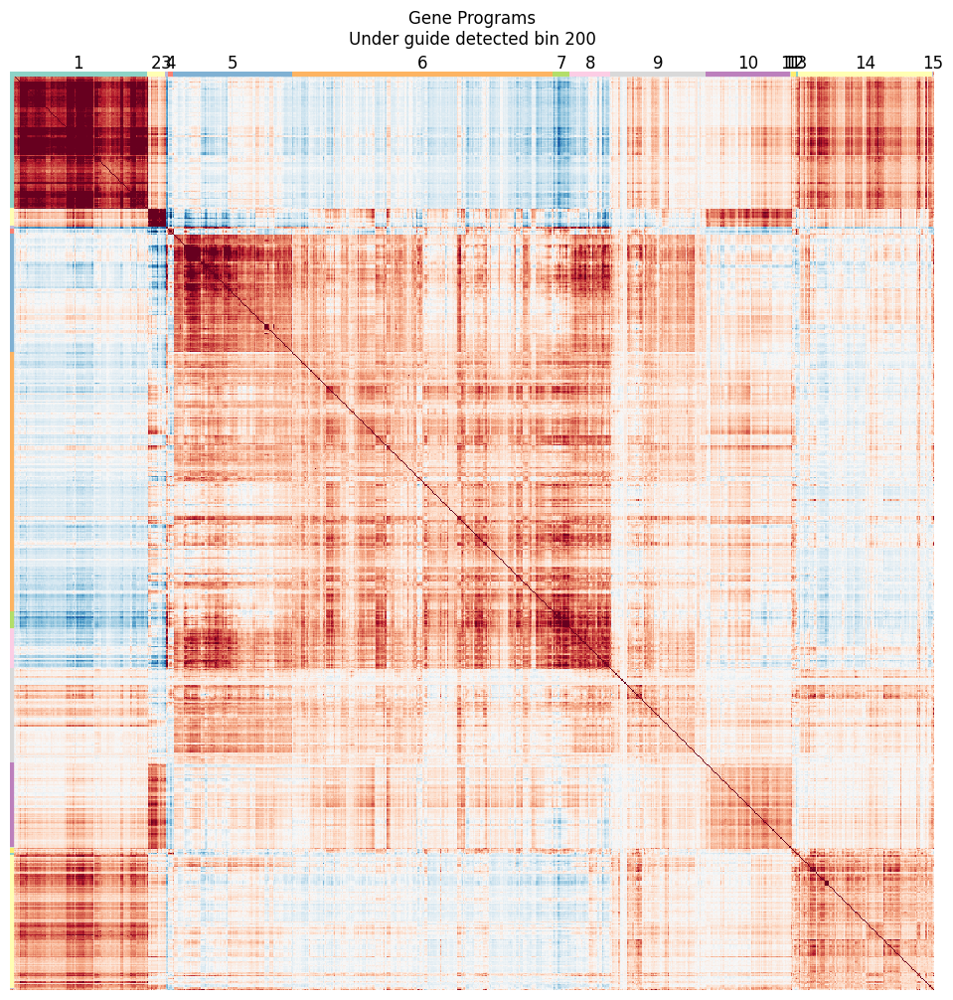

In [114]:
_, ax = plt.subplots(1, 1, figsize=(12, 12))
# cluster_df['recluster'] = cluster_df.cluster.apply(lambda x: 1 if x < 3 else(2 if x < 6 else (3 if x < 7 else 4)))
cluster_df.recluster = cluster_df.cluster
p_df = pd.DataFrame(corr_matrix, index=hvg_fdata.var_names, columns=hvg_fdata.var_names)
ax = sns.heatmap(p_df.loc[cluster_df.gene_name, cluster_df.gene_name], cmap='RdBu_r', vmin=-0.4, vmax=0.4, cbar=False)
ax.set_xticks([])
ax.set_yticks([])

# Draw thick lines to represent clusters
cluster_colors = sns.color_palette("Set3", len(np.unique(cluster_df.recluster)))
for i, cluster in enumerate(np.unique(cluster_df.recluster)):
    # Find columns belonging to this cluster
    cluster_cols = cluster_df[cluster_df['recluster'] == cluster].idx
    
    # Draw a thick line on top of the columns in the cluster
    x_start = cluster_cols.min() - 0.5  # Left edge of the cluster
    x_end = cluster_cols.max() + 0.5    # Right edge of the cluster
    ax.hlines(y=1.1, xmin=x_start, xmax=x_end, color=cluster_colors[i], linewidth=6)  # Adjust y based on where you want the line
    ax.vlines(x=-0.1, ymin=x_start, ymax=x_end, color=cluster_colors[i], linewidth=6)  # Adjust y based on where you want the line
    
    # Add cluster label above the line
    ax.text((x_start + x_end) / 2, 1, str(cluster), ha='center', va='bottom', color='black', fontsize=12, transform=ax.get_xaxis_transform())

ax.set_title('Gene Programs\nUnder guide detected bin 200', pad=20)
plt.show()

In [80]:
deg_df = cluster_df.copy()
deg_df.columns = ['Gene', 'raw', 'idx', 'Cluster']

deg_df.to_csv('DEG.csv', index=False, sep="\t")

In [81]:
!sshpass -p wang2024 ssh wpy@172.16.10.103 "mamba run -n gsea python ~/stereoseq/20240502-SPACseq/enrich.py"

Gene       object
raw         int64
idx         int64
Cluster     int64
dtype: object
/home/wpy/stereoseq/20240502-SPACseq/bin/go-basic.obo: fmt(1.2) rel(2024-04-24) 45,667 Terms
Enrichment analysis for list 0 completed successfully: 261
Enrichment analysis for list 1 completed successfully: 998
Enrichment analysis for list 2 completed successfully: 481
Enrichment analysis for list 3 completed successfully: 284



In [83]:
for i in range(4):
    enr = pd.read_csv(f"./GO/Cluster_{i}.result", sep="\t")
    results = enr.sort_values(by='Combined Score', ascending=False)
    results = results[results["Adjusted P-value"] < 0.05]
    results = results.loc[:, ["Term", "Genes", "Adjusted P-value"]]
    results["Cluster"] = i
    results["Gene Counts"] = results["Genes"].str.split(";").apply(len)
    results["Term"] = results["Term"].str.split("R-HSA").str[0]
    results = results.groupby("Cluster", as_index=False).apply(lambda x: x.sort_values(by='Adjusted P-value')).reset_index(drop=True)
    if not i: go_df = results
    else: go_df = pd.concat([go_df, results], axis=0)
# go_df.to_csv('./GO/Reactome.csv', index=None, sep='\t')
go_df

/tmp/ipykernel_76588/2802901595.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  results = results.groupby("Cluster", as_index=False).apply(lambda x: x.sort_values(by='Adjusted P-value')).reset_index(drop=True)
/tmp/ipykernel_76588/2802901595.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  results = results.groupby("Cluster", as_index=False).apply(lambda x: x.sort_values(by='Adjusted P-value')).reset

,Term,Genes,Adjusted P-value,Cluster,Gene Counts
0,Muscle Contraction,RYR1;ATP1A2;ATP2A1;SLN;TNNI2;DMD;SCN1B;MYBPC1;...,3.405481e-25,0,27
1,Striated Muscle Contraction,MYBPC1;MYBPC2;ACTN3;ACTN2;TMOD4;TPM2;TNNC2;TPM...,1.482074e-24,0,16
2,Cardiac Conduction,CACNB1;RYR1;SLN;KCNIP1;FXYD1;ATP2A1;ATP1A2;ATP...,1.495169e-06,0,10
3,Ion Homeostasis,RYR1;SLN;FXYD1;ATP2A1;ATP1A2;ATP1B2;TRDN,3.250891e-06,0,7
4,Ion Transport By P-type ATPases,SLN;FXYD1;ATP2A1;ATP1A2;ATP1B2,1.669475e-03,0,5
...,...,...,...,...,...
41,Signaling By Nuclear Receptors,ABCA1;CXCL12;MMP2;S1PR3;APOD;PLTP,4.244608e-02,3,6
42,"Defective B4GALT7 Causes EDS, Progeroid Type",BGN;DCN,4.288473e-02,3,2
43,Defective B3GALT6 Causes EDSP2 And SEMDJL1,BGN;DCN,4.288473e-02,3,2
44,Chondroitin Sulfate Biosynthesis,BGN;DCN,4.288473e-02,3,2


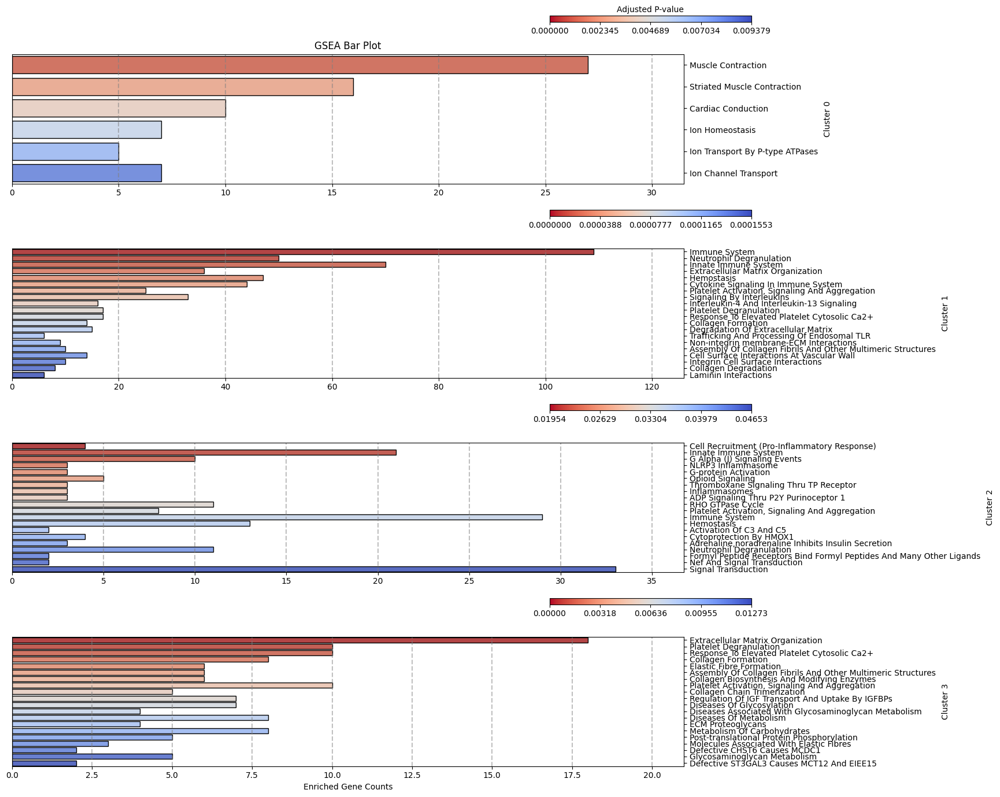

In [84]:
from matplotlib.ticker import FormatStrFormatter
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
fig, ax = plt.subplots(4, 1, figsize=(15, 16))
for cluster in range(4):
    gsea_results = go_df[go_df["Cluster"] == cluster][:20]

    barplot = sns.barplot(
        x='Gene Counts', 
        y='Term', 
        data=gsea_results, 
        palette="coolwarm_r",
        edgecolor='black',
        ax=ax[cluster]
    )
    for tick in ax[cluster].get_xticks():
        ax[cluster].axvline(x=tick, linestyle='--', color='gray', alpha=0.5)

    norm = plt.Normalize(gsea_results['Adjusted P-value'].min(), gsea_results['Adjusted P-value'].max())
    sm = plt.cm.ScalarMappable(cmap="coolwarm_r", norm=norm)
    sm.set_array([])
    cax = inset_axes(ax[cluster], width="30%", height="5%", loc='upper right',
                     bbox_to_anchor=(0.1, 0.3, 1, 1), bbox_transform=ax[cluster].transAxes, borderpad=0)
    if cluster == 0:
        cbar = fig.colorbar(sm, cax=cax, label="Adjusted P-value", orientation='horizontal', shrink=0.1)
        cbar.ax.xaxis.set_label_position('top')
    else: cbar = fig.colorbar(sm, cax=cax, orientation='horizontal', shrink=0.1)

    cbar_ticks = np.linspace(gsea_results['Adjusted P-value'].min(), gsea_results['Adjusted P-value'].max(), num=5)  # Adjust num for density
    cbar.set_ticks(cbar_ticks)
    cbar.ax.yaxis.set_major_formatter(FormatStrFormatter('%.4f'))

    ax[cluster].yaxis.tick_right()
    ax[cluster].yaxis.set_label_position('right')

    ax[cluster].set_xlabel('')
    ax[cluster].set_ylabel(f'Cluster {cluster}')

plt.subplots_adjust(hspace=0.5)
ax[0].set_title('GSEA Bar Plot')
ax[3].set_xlabel('Enriched Gene Counts')
plt.show()

In [120]:
cluster_df[cluster_df.gene_name == 'Spp1']

,gene_name,cluster,idx,recluster
707,Spp1,7,485,7


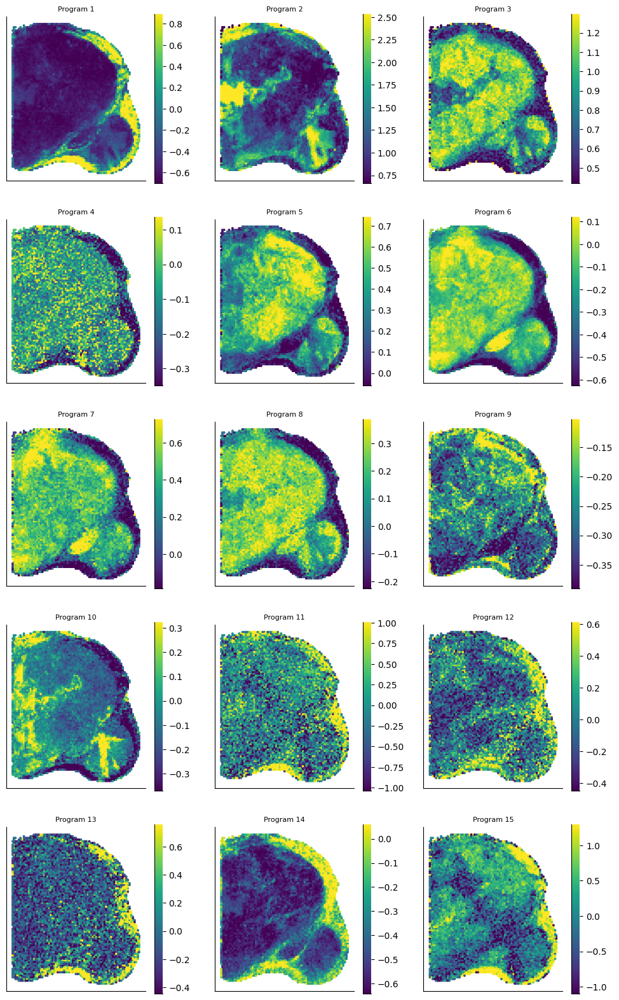

In [119]:
plot_data = hvg_fdata[hvg_fdata.obs.marker == 'B926-1', :].copy()

_, axs = plt.subplots(5, 3, figsize=(12, 20))
for cluster in cluster_df.recluster.unique():
    ax = axs[(cluster-1) // 3, (cluster-1) % 3]
    genes = cluster_df[cluster_df.recluster == cluster].gene_name.tolist()
    sc.tl.score_genes(plot_data, gene_list=genes, score_name='score')
    scatter = sq.pl.spatial_scatter(plot_data, shape=None, size=10, library_id='spatial', color='score', colorbar=False, vmin=np.quantile(plot_data.obs.score, 0.05), vmax=np.quantile(plot_data.obs.score, 0.95), ax=ax)
    ax.set_title(f'Program {cluster}', size=8)
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    cbar = plt.colorbar(ax.collections[0], ax=ax)
    cbar.outline.set_visible(False)
sns.despine()
plt.show()

# DEG vs Guide

In [11]:
gdata_trans = utils.combine_guide_replicates(gdata_trans)

In [37]:
import numpy as np
from scipy.stats import pearsonr
from concurrent.futures import ThreadPoolExecutor
from tqdm import tqdm

# Function to compute correlations for a given row i
def compute_correlation(i, gene_matrix, guide_matrix, n_genes):
    row_corr = np.zeros(n_genes)
    for j in range(n_genes):
        row_corr[j] = pearsonr(guide_matrix[:, i], gene_matrix[:, j])[0]
    return i, row_corr

# Number of genes
n_genes = len(hvg_fdata.var_names)
n_guides = len(gdata_trans.var_names)
gene_matrix = hvg_fdata.X.toarray()
guide_matrix = gdata_trans[gdata_trans.X.sum(axis=1) > 0, :].X.toarray()
corr_matrix = np.zeros([n_guides, n_genes])

In [40]:
# Use ThreadPoolExecutor with 16 threads
with ThreadPoolExecutor(max_workers=8) as executor:
    futures = [executor.submit(compute_correlation, i, gene_matrix, guide_matrix, n_genes) for i in range(n_guides)]
    
    # Collect results with progress bar
    for future in tqdm(futures, total=n_guides):
        i, row_corr = future.result()
        corr_matrix[i, :] = row_corr

print("Parallel computation completed successfully!")

  0%|          | 0/34 [00:00<?, ?it/s]

100%|██████████| 34/34 [01:23<00:00,  2.44s/it]

Parallel computation completed successfully!


In [66]:
markers = {"T": ["ITM2A", "GNLY", "CCL5", "CD160", "CCR5", "TRAC", "KLRG1", "SPOCK2", "TIGIT", "IL7R",  "CYTIP", "CD8B", "IL32", "AQP3", "GZMK", "NKG7", "CD7", "CCR7", "SELL", "SRGN", "TRAT1", "GZMB", "CD3G", "IL2RG",  "PRF1", "CD8A", "KLRB1", "CXCR4", "CST7", "ACAP1", "RGS1",  "ETS1",  "CD3D", "CD247", "CD52", "LTB", "LCK", "TRBC2", "CD69", "CD3E", "CCL4", "FOXP3", "GZMA",  "GZMH", "KLRD1", "PTPRC", "CD2", "TRBC1","TRBC2", "LDHB"], 
"Macrophages": ["CD68", "AIF1", "CD14", "IL1B", "MSR1", "CD86", "FCGR1A", "FCGR3A", "C1QA", "CSF1R", "IGSF6", "MS4A4A", "TREM2",  "CD163"], 
"DC": ["HLA-DQB1", "CD83", "LYZ", "IL3RA", "CLEC4C", "FCER1A", "C1orf162", "SIRPA", "CD207", "HLA-DQA1", "IRF8", "CLEC10A", "CD1C"],
"Endothelial": ["CDH5", "PLVAP", "CD34", "VWF", "PECAM1", "FLT1"], 
"Fibroblasts": ["LUM",  "THY1", "COL3A1", "COL1A1", "DCN", "PDGFRB"], 
"Malignant":[ "MUC1", "FXYD3", "MKI67", "MDK", "SOX4", "S100P",  "EPCAM", "ATP1B1"]}
gene_list = []
for ctype in markers:
    gene_list += utils.gene_mouse(hvg_fdata, markers[ctype])
gene_list = np.intersect1d(gene_list, hvg_fdata.var_names.tolist())

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


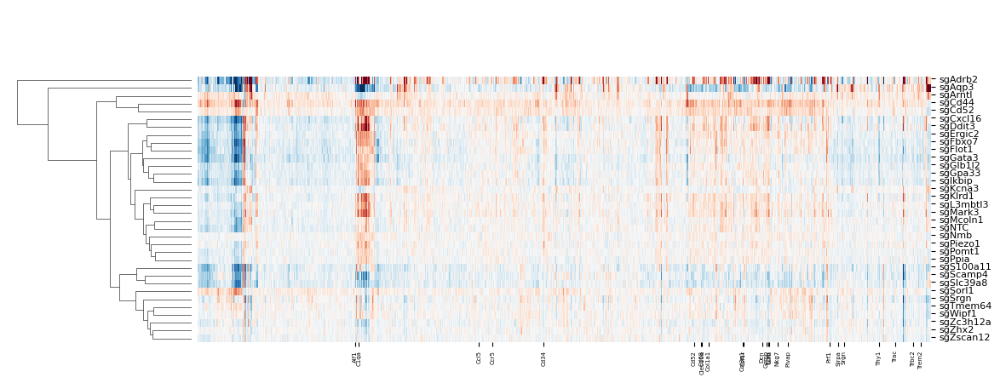

In [69]:
# g = sns.clustermap(corr_matrix, cmap='RdBu_r', vmax=0.05, vmin=-0.05, figsize=(12, 5))
p_df = pd.DataFrame(corr_matrix, index=gdata_trans.var_names, columns=hvg_fdata.var_names)
g = sns.clustermap(p_df.loc[:, cluster_df.gene_name], cmap='RdBu_r', vmin=-0.05, vmax=0.05, cbar_pos=None, figsize=(12, 5), col_cluster=False)
# gene_list = ['Spp1']
g.ax_heatmap.set_xticks(cluster_df[np.isin(cluster_df.gene_name, gene_list)].idx.tolist(), gene_list, size=5)
g.ax_heatmap.set_yticks(np.array(list(range(len(gdata_trans.var_names)))) + 0.3, gdata_trans.var_names.tolist(), size=8)
plt.show()